# Tutorial with LSST

We will use the parameter file "tests/parametersTest.cfg".
This contains a description of the bands and data to be used.
In this example we will generate mock data for the ugrizy LSST bands,
**fit each object with our GP using ugi bands only and see how it predicts the rz bands.**
This is an example for filling in/predicting missing bands in a fully bayesian way
with a flexible SED model quickly via our photo-z GP.

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats
import sys
sys.path.append('../')
from delight.io import *
from delight.utils import *
from delight.photoz_gp import PhotozGP

In [2]:
#%cd /Users/sylvie/MacOSX/GitHub/LSST/Delight
%cd ..

/Users/sylvie/MacOSX/GitHub/LSST/Delight


In [3]:
%mkdir tests_lsst

mkdir: tests_lsst: File exists


In [4]:
%mkdir data_lsst

mkdir: data_lsst: File exists


## Creating the parameter file
Let's create a parameter file from scratch.

In [5]:
paramfile_txt = """
# DELIGHT parameter file
# Syntactic rules:
# - You can set parameters with : or =
# - Lines starting with # or ; will be ignored
# - Multiple values (band names, band orders, confidence levels)
#   must beb separated by spaces
# - The input files should contain numbers separated with spaces.
# - underscores mean unused column
"""

Let's describe the bands we will use. This must be a superset (ideally the union) of all the bands involved in the training and target sets, including cross-validation. 

Each band should have its own file, containing a tabulated version of the filter response.

See example files shipped with the code for formatting.

In [6]:
paramfile_txt += """
[Bands]
names: lsst_u lsst_g lsst_r lsst_i lsst_z lsst_y
directory: data/FILTERS
numCoefs: 15
bands_verbose: True
bands_debug: True
bands_makeplots: True
"""

Let's now describe the system of SED templates to use (needed for the mean fct of the GP, for simulating objects, and for the template fitting routines).

Each template should have its own file (see shipped files for formatting example). 

- **lambdaRef** will be the pivot wavelenght used for normalizing the templates.

- **$p(z|t)$ and $p(t)$** containts parameters for the priors of each template, for $p(z|t) p(t)$. 

- Calibrating those numbers will be the topic of another tutorial.

By default the set of templates and the prior calibration can be left untouched.

In [7]:
paramfile_txt += """
[Templates]
directory: ./data/CWW_SEDs
names: El_B2004a Sbc_B2004a Scd_B2004a SB3_B2004a SB2_B2004a Im_B2004a ssp_25Myr_z008 ssp_5Myr_z008
p_t: 0.27 0.26 0.25 0.069 0.021 0.11 0.0061 0.0079
p_z_t:0.23 0.39 0.33 0.31 1.1 0.34 1.2 0.14
lambdaRef: 4.5e3
"""

The next section if for simulating a photometric catalogue from the templates. 

- **catalog files** (trainingFile, targetFile) will be created, and have the adequate format for the later stages. 

- **noiseLevel** describes the relative error for the absolute flux in each band.

In [8]:
paramfile_txt += """
[Simulation]
numObjects: 1000
noiseLevel: 0.03
trainingFile: data_lsst/galaxies-fluxredshifts.txt
targetFile: data_lsst/galaxies-fluxredshifts2.txt
"""

We now describe the training file.

- `catFile` is the input catalog. This should be a tab or space separated file with numBands + 1 columns.

- `bandOrder` describes the ordering of the bands in the file. Underscore `_` means an ignored column, for example a band that shouldn't be used. The band names must correspond to those in the filter section.

- `redshift` is for the photometric redshift. 
- `referenceBand` is the reference band for normalizing the fluxes and luminosities. 
- `extraFracFluxError` is an extra relative error to add in quadrature to the flux errors.

- `paramFile` will contain the output of the GP applied to the training galaxies, i.e. the minimal parameters that must be stored in order to reconstruct the fit of each GP.

- `crossValidate` is a flag for performing optional cross-validation. If so, `CVfile` will contain cross-validation data. `crossValidationBandOrder` is similar to `bandOrder` and describes the bands to be used for cross-validation. In this example I have left the R band out of `bandOrder` and put it in `crossValidationBandOrder`. However, this feature won't work on simulated data, only on real data (i.e., the `simulateWithSEDs` script below does not generate cross-validation bands).

- `numChunks` is the number of chunks to split the training data into. At present please stick to 1.

In [9]:
paramfile_txt += """
[Training]
catFile: data_lsst/galaxies-fluxredshifts.txt
bandOrder: lsst_u lsst_u_var lsst_g lsst_g_var _ _ lsst_i lsst_i_var lsst_z lsst_z_var lsst_y lsst_y_var redshift
referenceBand: lsst_i
extraFracFluxError: 1e-4
paramFile: data_lsst/galaxies-gpparams.txt
crossValidate: False
CVfile: data_lsst/galaxies-gpCV.txt
crossValidationBandOrder: _ _ _ _ lsst_r lsst_r_var _ _ _ _ _ _
numChunks: 1
"""

The section of the target catalog has very similar structure and parameters. The `catFile`, `bandOrder`, `referenceBand`, and `extraFracFluxError` have the same meaning as for the training, but of course don't have to be the same.

- `redshiftpdfFile` and `redshiftpdfFileTemp` will contain tabulated redshift posterior PDFs for the delight-apply and templateFitting scripts. 

- Similarly, `metricsFile` and `metricsFileTemp` will contain metrics calculated from the PDFs, like mean, mode, etc. This is particularly informative if `redshift` is also provided in the target set.

- The compression mode can be activated with `useCompression` and will produce new redshift PDFs in the file `redshiftpdfFileComp`, while `compressIndicesFile` and `compressMargLikFile` will contain the indices and marginalized likelihood for the objects that were kept during compression. The number of objects is controled with `Ncompress`.

In [10]:
paramfile_txt += """
[Target]
catFile: data_lsst/galaxies-fluxredshifts2.txt
bandOrder: lsst_u lsst_u_var lsst_g lsst_g_var lsst_r lsst_r_var _ _ lsst_z lsst_z_var lsst_y lsst_y_var redshift
referenceBand: lsst_r
extraFracFluxError: 1e-4
redshiftpdfFile: data_lsst/galaxies-redshiftpdfs.txt
redshiftpdfFileTemp: data_lsst/galaxies-redshiftpdfs-cww.txt
metricsFile:  data_lsst/galaxies-redshiftmetrics.txt
metricsFileTemp:  data_lsst/galaxies-redshiftmetrics-cww.txt
useCompression: False
Ncompress: 10
compressIndicesFile: data_lsst/galaxies-compressionIndices.txt
compressMargLikFile: data_lsst/galaxies-compressionMargLikes.txt
redshiftpdfFileComp: data_lsst/galaxies-redshiftpdfs-comp.txt
"""

Finally, there are various other parameters related to the method itself.

- The (hyper)parameters of the Gaussian process are `zPriorSigma`, `ellPriorSigma` (locality of the model predictions in redshift and luminosity), `fluxLuminosityNorm` (some normalization parameter), `alpha_C`, `alpha_L`, `V_C`, `V_L` (smoothness and variance of the latent SED model), `lines_pos`, `lines_width` (positions and widths of the lines in the latent SED model). 

- `redshiftMin`, `redshiftMax`, and `redshiftBinSize` describe the linear fine redshift grid to compute PDFs on.

- `redshiftNumBinsGPpred` describes the granuality (in log scale!) for the GP kernel to be exactly calculated on; it will then be interpolated on the finer grid.

- `redshiftDisBinSize` is the binsize for a tomographic redshift binning.

- `confidenceLevels` are the confidence levels to compute in the redshift PDF metrics.

The values below should be a good default set for all of those parameters. 

In [11]:
paramfile_txt += """
[Other]
rootDir: ./
zPriorSigma: 0.2
ellPriorSigma: 0.5
fluxLuminosityNorm: 1.0
alpha_C: 1.0e3
V_C: 0.1
alpha_L: 1.0e2
V_L: 0.1
lines_pos: 6500 5002.26 3732.22
lines_width: 20.0 20.0 20.0
redshiftMin: 0.1
redshiftMax: 1.101
redshiftNumBinsGPpred: 100
redshiftBinSize: 0.001
redshiftDisBinSize: 0.2
confidenceLevels: 0.1 0.50 0.68 0.95
"""

In [12]:
with open('tests_lsst/parametersTest.cfg','w') as out:
    out.write(paramfile_txt)

## Running Delight

### Processing the filters and templates, and create a mock catalog

- First, we must fit the band filters with a gaussian mixture. 
This is done with this script:

In [13]:
%run ./scripts/processFilters.py tests_lsst/parametersTest.cfg

2021-02-15 16:27:15,574 processFilters.py __main__[67112] INFO Start processFilters.py
2021-02-15 16:27:15,574 processFilters.py __main__[67112] INFO --- Process FILTERS ---
2021-02-15 16:27:15,577 ipykernel_launcher.py, delight.io[67112] WARNING Input parameter file:tests_lsst/parametersTest.cfg
2021-02-15 16:27:15,578 ipykernel_launcher.py, delight.io[67112] WARNING Parameters read:


>  rootDir              ./
>  bands_directory      data/FILTERS
>  bandNames            lsst_u lsst_g lsst_r lsst_i lsst_z lsst_y
>  numCoefs             15
>  bands_verbose        True
>  bands_debug          True
>  bands_makeplots      True
>  templates_directory  ./data/CWW_SEDs
>  lambdaRef            4500.0
>  templates_names      El_B2004a Sbc_B2004a Scd_B2004a SB3_B2004a SB2_B2004a Im_B2004a ssp_25Myr_z008 ssp_5Myr_z008
>  p_t                  [0.27   0.26   0.25   0.069  0.021  0.11   0.0061 0.0079]
>  p_z_t                [0.23 0.39 0.33 0.31 1.1  0.34 1.2  0.14]
>  templates_verbose    False
>  templates_debug      False
>  training_numChunks   1
>  training_paramFile   data_lsst/galaxies-gpparams.txt
>  training_catFile     data_lsst/galaxies-fluxredshifts.txt
>  training_referenceBand lsst_i
>  training_bandOrder   lsst_u lsst_u_var lsst_g lsst_g_var _ _ lsst_i lsst_i_var lsst_z lsst_z_var lsst_y lsst_y_var redshift
>  training_extraFracFluxError 0.0001
>  training_crossVa

/Users/sylvie/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:475: RuntimeWarning: Number of calls to function has reached maxfev = 6200.
  warnings.warn(errors[info][0], RuntimeWarning)


lsst_y 

- Second, we will process the library of SEDs and project them onto the filters,
(for the mean fct of the GP) with the following script (which may take a few minutes depending on the settings you set):

In [14]:
%run ./scripts/processSEDs.py tests_lsst/parametersTest.cfg

2021-02-15 16:27:31,891 processSEDs.py, __main__[67112] INFO --- Process SED ---


- Third, we will make some mock data with those filters and SEDs:

produce files `galaxies-redshiftpdfs.txt` and `galaxies-redshiftpdfs2.txt` for trainning and target

In [15]:
%run ./scripts/simulateWithSEDs.py tests_lsst/parametersTest.cfg

2021-02-15 16:27:55,951 simulateWithSEDs.py, __main__[67112] INFO --- Simulate with SED ---


### Train and apply
Run the scripts below. There should be a little bit of feedback as it is going through the lines.
For up to **1e4 objects** it should only take a few minutes max, depending on the settings above.

In [16]:
%run ./scripts/templateFitting.py tests_lsst/parametersTest.cfg

2021-02-15 16:27:56,718 templateFitting.py, __main__[67112] INFO --- TEMPLATE FITTING ---


--- TEMPLATE FITTING ---
Thread number / number of threads:  1 1
Input parameter file: tests_lsst/parametersTest.cfg
Number of Target Objects 1000
Thread  0  analyzes lines  0  to  1000


/Users/sylvie/MacOSX/GitHub/LSST/Delight/scripts/templateFitting.py:67: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  numObjectsTarget = np.sum(1 for line in open(params['target_catFile']))


In [17]:
%run ./scripts/delight-learn.py tests_lsst/parametersTest.cfg

2021-02-15 16:28:04,599 delight-learn.py, __main__[67112] INFO --- DELIGHT-LEARN ---
/Users/sylvie/MacOSX/GitHub/LSST/Delight/scripts/delight-learn.py:38: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  numObjectsTraining = np.sum(1 for line in open(params['training_catFile']))


Number of Training Objects 1000
Thread  0  analyzes lines  0  to  1000


In [18]:
%run ./scripts/delight-apply.py tests_lsst/parametersTest.cfg

2021-02-15 16:28:17,367 delight-apply.py, __main__[67112] INFO --- DELIGHT-APPLY ---
/Users/sylvie/MacOSX/GitHub/LSST/Delight/scripts/delight-apply.py:51: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  numObjectsTraining = np.sum(1 for line in open(params['training_catFile']))
/Users/sylvie/MacOSX/GitHub/LSST/Delight/scripts/delight-apply.py:52: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  numObjectsTarget = np.sum(1 for line in open(params['target_catFile']))


Number of Training Objects 1000
Number of Target Objects 1000
Thread  0  analyzes lines  0  to  1000
None band 1 y_pred_bin [2309.75949205 2174.62690101 2047.0738691  1922.37754988 1799.10965591
 1682.26750722 1577.67512763 1484.33938043 1398.42180241 1318.04881499
 1244.28078062 1175.5821708  1111.68865354 1052.60063543  996.7824836
  943.15497139  892.57136992  845.5881533   801.6696123   760.46673893
  721.71572495  685.117348    650.3599167   617.27665032  585.84602359
  556.25238154  528.19705342  501.37198024  475.87218821  451.95948697
  429.24615759  407.63862456  386.8830015   367.18782958  348.38911705
  330.37408898  313.09034288  296.74907186  281.19667748  266.37006037
  252.05964648  238.42926244  225.60015031  213.37778215  201.99558358
  191.35356237  181.31095403  171.75960747  162.70515322  154.16779122
  145.99524819  138.20464624  130.80217431  123.78287689  117.17384452
  110.91405327  104.89550519   99.14090501   93.68173185   88.63156022
   83.8713209    79.25736

None band 2 y_pred_bin [3.83905278e+03 3.63523852e+03 3.44134845e+03 3.25794108e+03
 3.08363634e+03 2.91824119e+03 2.76151488e+03 2.61274003e+03
 2.47160168e+03 2.33777415e+03 2.21092926e+03 2.09074030e+03
 1.97686904e+03 1.86914599e+03 1.76718881e+03 1.67064946e+03
 1.57949209e+03 1.49326612e+03 1.41178861e+03 1.33487067e+03
 1.26216538e+03 1.19342888e+03 1.12841712e+03 1.06689595e+03
 1.00869286e+03 9.53524989e+02 9.01217245e+02 8.51570269e+02
 8.04441771e+02 7.59676263e+02 7.17165449e+02 6.76796857e+02
 6.38463159e+02 6.02087933e+02 5.67561399e+02 5.34797423e+02
 5.03721956e+02 4.74267165e+02 4.46353255e+02 4.19882947e+02
 3.94771050e+02 3.70934781e+02 3.48305330e+02 3.26867843e+02
 3.06602571e+02 2.87494402e+02 2.69549522e+02 2.52786188e+02
 2.37182339e+02 2.22636106e+02 2.09005006e+02 1.96166673e+02
 1.83991411e+02 1.72338423e+02 1.61110378e+02 1.50266113e+02
 1.39800131e+02 1.29718266e+02 1.20027461e+02 1.10761351e+02
 1.01981500e+02 9.37243952e+01 8.60076533e+01 7.88419245e+01
 

   35.13415819   34.01911132   32.9316986    31.83835192   30.7763271 ] y_var_bin [ 1.55899143e-02  1.64256935e-02  1.38719673e-02  1.24132037e-08
  1.14930341e-02  1.04829775e-02  8.51344104e-03  8.59460604e-03
  8.36341217e-03  6.07751212e-03  5.23942558e-03  5.51578158e-03
  2.34563499e-09  2.36712428e-04  4.01615225e-04  4.33738444e-03
  1.77480427e-09  2.64317638e-03  8.28131141e-10  2.42085224e-04
  2.06536942e-03  4.75207682e-10  3.57437093e-07  6.65284017e-05
  8.18194112e-04  1.81494486e-03  1.06059526e-03  9.63906411e-04
  1.43615976e-03  5.75187357e-04  6.25037113e-04  4.23944682e-04
  3.78537042e-04  4.01463190e-04  8.06168406e-04  3.73917368e-04
  4.92743729e-06  3.87072801e-04  2.85207286e-04  2.48768048e-04
  2.80713475e-04  2.66658880e-04  2.32681778e-04  2.08071799e-04
  1.48537111e-04  1.57055848e-04  2.74634125e-04  1.37670820e-04
  1.05509893e-04  8.94587807e-05  2.19930777e-06  9.07114354e-05
  1.59241376e-04  6.35441780e-05  5.76186904e-05  5.30521031e-05
  4.0136

None band 2 y_pred_bin [1886.22413391 1795.78932553 1709.53539191 1627.67322493 1549.73259149
 1475.61089917 1405.23669568 1338.20488177 1274.37350037 1213.5029503
 1155.48134777 1100.2488639  1047.85820273  998.20857889  951.0571441
  906.14558969  863.40615696  822.71858738  784.15553453  747.64812319
  712.9533549   680.03924819  648.65612026  618.78566624  590.38198459
  563.3808964   537.73995241  513.26358352  489.94526148  467.78254965
  446.76268768  426.78798019  407.73909445  389.60255138  372.34224239
  355.91450305  340.23435857  325.30046872  311.10315157  297.55299374
  284.54977439  272.2413552   260.64993262  249.59519852  239.08190576
  229.13425841  219.71332938  210.75514416  202.22235296  194.08007753
  186.13961439  178.57027898  171.46225078  164.53067989  157.93359226
  151.55424543  145.40890147  139.63594427  133.87962634  128.39718937
  123.09952081  117.85522816  112.72303259  107.60502066  102.60138481
   97.7184315    92.92439373   88.31504209   83.86539754

  1.17132070e-06  1.10789843e-06 -1.04984972e-13  9.25433360e-07]
None band 0 y_pred_bin [4.22660379e+02 3.97925008e+02 3.74564415e+02 3.52624310e+02
 3.31892251e+02 3.12349915e+02 2.93987334e+02 2.76691137e+02
 2.60390943e+02 2.45039527e+02 2.30558196e+02 2.16862831e+02
 2.03913401e+02 1.91696336e+02 1.80131012e+02 1.69166762e+02
 1.58803197e+02 1.48975177e+02 1.39676062e+02 1.30897102e+02
 1.22602201e+02 1.14776438e+02 1.07392735e+02 1.00422677e+02
 9.38485963e+01 8.76417999e+01 8.17841703e+01 7.62535472e+01
 7.10283243e+01 6.60878594e+01 6.14188916e+01 5.70048226e+01
 5.28303955e+01 4.88778993e+01 4.51386155e+01 4.16068707e+01
 3.82784768e+01 3.51382147e+01 3.21944887e+01 2.94502133e+01
 2.69055452e+01 2.45610241e+01 2.24234486e+01 2.04783789e+01
 1.87114651e+01 1.71044829e+01 1.56318179e+01 1.42717112e+01
 1.30093351e+01 1.18300253e+01 1.07273420e+01 9.70133679e+00
 8.75041134e+00 7.87489154e+00 7.07419380e+00 6.34515711e+00
 5.68357584e+00 5.08566292e+00 4.54745318e+00 4.06479457e

None band 1 y_pred_bin [1965.15573019 1858.13606433 1755.91568895 1658.78272961 1566.33876402
 1478.89084356 1396.63674798 1319.30885439 1246.64919049 1178.2757044
 1113.78322216 1052.91263592  995.53731292  941.55366778  890.57113997
  842.2083777   796.44274936  753.18949981  712.42670868  673.99389745
  637.63320051  603.1862391   570.5240372   539.53825609  510.17005634
  482.30969249  455.90642238  430.87707517  407.16567871  384.70097351
  363.42780225  343.27594368  324.17700441  306.08307635  288.94711475
  272.72979759  257.39236054  242.89751213  229.20287532  216.26649647
  204.02373844  192.43332805  181.48558753  171.1286209   161.32310734
  152.05094743  143.26593231  134.92791205  127.02803397  119.55358121
  112.4724699   105.78097884   99.47085731   93.51706551   87.912573
   82.6625937    77.73816751   73.11432376   68.79565305   64.75478773
   60.95122025   57.30317938   53.78874257   50.4241058    47.17602599
   44.1226346    41.36142679   39.02232089   37.00930091 

    5.70102354    5.24880805    4.84681201    4.48964776    4.16689971] y_var_bin [ 1.74148281e-02  1.45971714e-02  1.44358901e-09  1.27259081e-02
  3.02348872e-09  9.87516853e-03  8.87754719e-03  2.44164914e-04
  2.43061426e-04  2.61268168e-04  6.45713371e-03  2.02623233e-04
  5.35632922e-03  1.54547096e-04  5.61426385e-03  4.68118450e-03
  3.23149102e-03  2.26722370e-03  4.11421436e-05  2.31256058e-03
  3.48354882e-03  1.91298378e-03  3.16796444e-03  2.95305298e-03
  1.09469800e-03  1.17608942e-03  2.12009451e-03  1.88272986e-03
  1.68070978e-03  8.19887155e-04  1.43298217e-03  1.29468577e-03
  5.95324314e-04 -1.85863055e-10  4.61700040e-04  4.58258332e-04
 -7.47280510e-10  2.52562812e-06  7.70637855e-04  2.73714114e-04
 -6.46312676e-10  2.34435637e-04  2.28403587e-04  2.03174145e-04
  7.41394058e-06  1.81817042e-05  1.75753906e-04  2.97783798e-05
  1.20350438e-04  1.02997989e-04  1.10366893e-04  8.57961228e-05
  1.03249440e-05  7.82641991e-05  7.65558315e-05  7.01955973e-05
  2.1181

None band 3 y_pred_bin [3152.61396216 2991.47912779 2841.83792856 2701.7808224  2566.81614552
 2442.53674922 2325.74762631 2211.64793468 2100.49121887 1995.39794099
 1888.36984392 1784.90819567 1694.32714108 1612.55103422 1536.26604703
 1461.47527257 1390.04125884 1316.73230634 1216.82171136 1102.7332383
 1065.28285034 1047.85386991 1017.10711578  972.03765032  925.53376375
  882.02048083  840.43299254  798.744536    758.45551725  719.52857345
  683.40103732  649.37152986  615.76685716  578.76103304  540.44306782
  503.23071081  467.70677674  434.65266901  401.82126296  370.66051673
  344.23052279  322.20651462  304.31603782  288.86437229  274.2416544
  261.07300975  249.13453025  237.46745149  226.4017596   216.6172702
  208.5995027   202.58017042  196.67113014  192.35426169  189.33691871
  189.95135907  188.69698972  188.05335985  182.62453549  177.20122671
  170.2073348   163.98507975  156.38955888  150.84861085  144.87569464
  139.266194    133.57194785  128.02386211  116.14314819 

   35.37668274   34.25393909   33.15902034   32.05812665   30.98877102] y_var_bin [ 1.58058973e-02  1.66532544e-02  1.40641496e-02  2.04535224e-08
  1.16522589e-02  1.06282092e-02  8.63138740e-03  8.71367635e-03
  8.47927925e-03  6.16171132e-03  5.31201407e-03  5.59219821e-03
  6.37100889e-09  2.39995403e-04  4.07182395e-04  4.39747514e-03
  4.75230540e-09  2.67979609e-03  3.37686808e-09  2.45441278e-04
  2.09398398e-03  2.56887961e-09  3.64256410e-07  6.74517745e-05
  8.29530480e-04  1.84008950e-03  1.07528948e-03  9.77261052e-04
  1.45605661e-03  5.83156730e-04  6.33696991e-04  4.29818669e-04
  3.83782427e-04  4.07025592e-04  8.17337287e-04  3.79098045e-04
  4.99628320e-06  3.92435621e-04  2.89158876e-04  2.52214788e-04
  2.84602727e-04  2.70353391e-04  2.35905556e-04  2.10954614e-04
  1.50595139e-04  1.59231862e-04  2.78438973e-04  1.39578238e-04
  1.06971751e-04  9.06982577e-05  2.22992690e-06  9.19682321e-05
  1.61447531e-04  6.44245878e-05  5.84169999e-05  5.37871388e-05
  4.0692

 3.54987114e+00 3.16358605e+00 2.79953761e+00 2.45268833e+00] y_var_bin [ 1.72983977e-02  1.44995738e-02 -2.82627215e-08  1.26408217e-02
 -2.30243575e-08  9.80913959e-03  8.81818770e-03  2.42511317e-04
  2.41416429e-04  2.59502601e-04  6.41395670e-03  2.01251611e-04
  5.32051167e-03  1.53498468e-04  5.57672381e-03  4.64988173e-03
  3.20987846e-03  2.25205677e-03  4.08546104e-05  2.29709163e-03
  3.46025355e-03  1.90018640e-03  3.14677930e-03  2.93330464e-03
  1.08737124e-03  1.16821873e-03  2.10591447e-03  1.87013661e-03
  1.66946704e-03  8.14398285e-04  1.42339565e-03  1.28602380e-03
  5.91336982e-04 -8.26545553e-09  4.58606167e-04  4.55187612e-04
 -8.37558403e-09  2.50124502e-06  7.65479619e-04  2.71877377e-04
 -7.79414047e-09  2.32861648e-04  2.26870014e-04  2.01809297e-04
  7.35762179e-06  1.80535011e-05  1.74572591e-04  2.95728288e-05
  1.19539591e-04  1.02303199e-04  1.09622925e-04  8.52164549e-05
  1.02497886e-05  7.77350164e-05  7.60381380e-05  6.97204994e-05
  2.09814525e-06  

   14.82565862   13.36082898   12.04237529   10.88930305    9.82801927] y_var_bin [ 1.64205342e-02  1.73008414e-02  1.46110559e-02  2.57115636e-08
  1.21053753e-02  1.10415039e-02  8.96703301e-03  9.05252164e-03
  8.80900950e-03  6.40131994e-03  5.51858100e-03  5.80966026e-03
  9.11296844e-09  2.49330256e-04  4.23018373e-04  4.56847834e-03
  6.87457160e-09  2.78400502e-03  5.21696373e-09  2.54987164e-04
  2.17541259e-03  4.01184974e-09  3.79750410e-07  7.00759668e-05
  8.61788948e-04  1.91164470e-03  1.11710444e-03  1.01526400e-03
  1.51267805e-03  6.05834337e-04  6.58339864e-04  4.46533436e-04
  3.98706430e-04  4.22853929e-04  8.49121049e-04  3.93840304e-04
  5.19113830e-06  4.07696452e-04  3.00403633e-04  2.62022897e-04
  2.95670250e-04  2.80866782e-04  2.45079374e-04  2.19158159e-04
  1.56451508e-04  1.65424058e-04  2.89266660e-04  1.45006137e-04
  1.11131688e-04  9.42253618e-05  2.31681582e-06  9.55446875e-05
  1.67725757e-04  6.69299458e-05  6.06887323e-05  5.58788210e-05
  4.2274

None band 0 y_pred_bin [555.2990628  522.83815937 492.16144103 463.32026372 436.06958874
 410.36861313 386.113884   363.16076766 341.48245178 321.02968037
 301.69491187 283.40459795 266.11883069 249.78754875 234.37013676
 219.84251429 206.189993   193.34379331 181.28457041 169.96903755
 159.34829476 149.38909778 140.05232586 131.3022328  123.11019917
 115.43215265 108.24332356 101.5140348   95.220124    89.33070384
  83.821255    78.66869195  73.85036741  69.34630198  65.13500599
  61.19808328  57.51605463  54.07301766  50.85307123  47.84029453
  45.0215556   42.38414704  39.91570875  37.60491908  35.44003594
  33.4112      31.50945261  29.725614    28.05173172  26.48035769
  25.00480093  23.61823172  22.31465786  21.08856473  19.93503436
  18.84933556  17.82693459  16.86343612  15.95475793  15.09740295
  14.28771846  13.52291878  12.80016323  12.11674689  11.47027609
  10.85857667  10.27984179   9.73231847   9.21427416   8.72435412
   8.26116809   7.82353049   7.41028433   7.0202659  

None band 3 y_pred_bin [1865.50758359 1775.01521398 1688.80687427 1606.89771362 1528.74120816
 1454.35813005 1383.91715305 1317.1174298  1253.8885897  1193.92428743
 1137.08996376 1082.96532827 1031.5614188   982.74636889  936.41514446
  892.26726812  850.34541218  810.41617199  772.48378264  737.25660146
  702.4761115   669.19536825  637.68903986  607.76458331  579.37473844
  552.30904329  526.62193421  502.28644644  479.32718609  457.39414795
  436.50845656  416.6213982   397.66900928  379.52738783  362.18995617
  345.79739702  330.17080059  315.26088586  301.11649714  287.70459823
  274.97448585  262.82851689  251.17174342  240.09753943  229.69562431
  219.51872606  209.81423493  200.75091514  192.08026527  183.74004182
  175.80483567  168.20562517  160.93021618  154.06520244  147.52703655
  141.33582641  135.44265383  129.82023146  124.46299266  119.27437313
  114.45449755  109.82378627  105.54896669  101.47263393   97.6170271
   93.87187682   90.37254234   87.02478085   83.8634646

None band 1 y_pred_bin [2001.2091324  1901.95613602 1807.3760824  1717.74564043 1632.45277449
 1551.42204385 1474.48142731 1401.26112417 1331.63996686 1265.48769407
 1202.72031374 1143.1734884  1086.50509872 1032.5698036   981.34426191
  932.75912021  886.64328527  842.65313786  800.75449867  760.94803143
  723.10408586  687.14155945  652.9603403   620.45884494  589.64048482
  560.38631514  532.53213608  506.04705167  480.89277362  456.9909846
  434.30793134  412.69761618  392.15846612  372.67018966  354.14998087
  336.55424232  319.84678641  304.07899416  289.08711606  274.79996993
  261.28702786  248.46030335  236.16815825  224.49574543  213.30230622
  202.56738273  192.34066239  182.66536982  173.5250164   164.79790824
  156.54690844  148.76426353  141.32920689  134.33941543  127.59966914
  121.18736147  115.22972395  109.57105569  104.28396747   99.28517524
   94.55987559   90.21805979   86.16818913   82.46103369   79.06140727
   75.96124075   73.10980329   70.45508019   67.9286026

None band 0 y_pred_bin [568.25112982 535.03227074 503.64012012 474.12631408 446.2400917
 419.93971326 395.11932295 371.63089067 349.44698922 328.51717122
 308.73151507 290.01462932 272.32571793 255.61355935 239.83656915
 224.9701271  210.99919497 197.85338919 185.51291376 173.93347245
 163.06502487 152.87355145 143.31901913 134.36484803 125.98175128
 118.12462876 110.76813314 103.88189518  97.44118903  91.41440704
  85.77645807  80.5037182   75.57301198  70.96389408  66.65437365
  62.62562551  58.85771617  55.33437237  52.03932215  48.95627339
  46.07178787  43.37286185  40.84684695  38.48215751  36.26677759
  34.1906179   32.24451089  30.41906269  28.70613538  27.09810718
  25.58813107  24.16921804  22.83523613  21.58054213  20.40010337
  19.2890783   18.24282745  17.256853    16.32697749  15.4496223
  14.62104954  13.83840853  13.09879237  12.39943302  11.73788101
  11.11191145  10.51967537   9.9593789    9.42924908   8.92789957
   8.45390769   8.0060602    7.58317311   7.1840556    

  1.26528227e-06  1.24513684e-06  1.09437776e-06  8.92727470e-07]
None band 3 y_pred_bin [5498.91250843 5208.85817015 4933.35678069 4673.34116389 4426.89372483
 4193.77964585 3973.65413376 3765.4147851  3568.46262828 3382.14063681
 3205.80053121 3038.81355759 2880.5761405  2730.65978133 2588.40581457
 2453.18216419 2324.8254465  2202.7324605  2086.64807917 1976.34835142
 1871.40314303 1771.57186003 1676.633753   1586.4161588  1500.84630235
 1419.68622454 1342.80805814 1270.03172231 1201.20338223 1136.06178596
 1074.37530319 1015.88840509  960.42161184  907.81991739  857.94151738
  810.65669608  765.84995261  723.46026978  683.43705759  645.70270308
  610.15169848  576.69023398  545.19932044  515.48019613  487.28916232
  460.38253282  434.60587092  409.89338256  386.18468062  363.45455998
  341.74871558  321.13867908  301.78087242  283.70890551  266.94595764
  251.43709525  237.03046268  223.57003782  210.85722996  198.76207505
  187.36079924  176.66938349  166.57562192  157.03956667  1

   26.03984826   24.41299092   23.34505389   22.26338306   20.9456429 ] y_var_bin [ 1.56006253e-02  1.64369953e-02  1.38815149e-02 -5.88555940e-09
  1.15009460e-02  1.04901950e-02  8.51930183e-03  8.60052452e-03
  8.36917269e-03  6.08169717e-03  5.24303369e-03  5.51958133e-03
 -1.73382726e-09  2.36872401e-04  4.01889617e-04  4.34037426e-03
  2.22448577e-10  2.64499849e-03  7.65800514e-11  2.42251774e-04
  2.06679392e-03  5.29045154e-10  3.57924009e-07  6.65746867e-05
  8.18759013e-04  1.81619741e-03  1.06132755e-03  9.64572062e-04
  1.43715121e-03  5.75584947e-04  6.25469107e-04  4.24237972e-04
  3.78799009e-04  4.01740963e-04  8.06725325e-04  3.74176106e-04
  4.93162668e-06  3.87339361e-04  2.85404752e-04  2.48940348e-04
  2.80907777e-04  2.66843454e-04  2.32842880e-04  2.08215891e-04
  1.48640102e-04  1.57164681e-04  2.74824029e-04  1.37766216e-04
  1.05583072e-04  8.95208578e-05  2.20116496e-06  9.07743190e-05
  1.59351504e-04  6.35882694e-05  5.76586703e-05  5.30889102e-05
  4.0164

   24.63360516   22.1542464    19.80720849   17.54043182   15.39165515] y_var_bin [ 9.54982925e-07  1.70683927e-02  1.53467745e-02  5.71641792e-05
  2.98765137e-05  1.21604463e-02  8.77292189e-03  1.05512089e-02
  1.01337689e-02  7.21923822e-03  6.62315398e-03  2.16338909e-04
  4.36479117e-03  3.87424276e-03  2.71576538e-04  4.34056884e-03
  3.43165566e-03  3.09837586e-03  3.04817959e-03  2.43970701e-03
  2.59520815e-03  8.01247713e-06  1.87832305e-03  4.34635771e-04
  1.86453652e-03  1.74851830e-03  1.26945094e-03  1.55690677e-03
  1.07228571e-03  3.49877873e-04  3.67473082e-04  6.04206200e-04
  1.07701765e-03  9.40019986e-04  5.73208052e-04  5.08588737e-04
  7.19979937e-04  6.13420277e-04  3.30749321e-04  3.02795367e-04
  2.31474582e-04  4.71566835e-04  2.29419958e-04  1.53334267e-04
  1.77939109e-04  3.38624019e-04  1.55132850e-04  2.29950281e-04
  1.31226990e-04  1.69602419e-07  2.24451597e-07  7.82892111e-05
  9.46975148e-05  1.64251325e-04  6.58184459e-05  5.65017813e-05
  5.4490

None band 0 y_pred_bin [781.22461794 739.22273037 699.51514414 662.15534937 626.84168855
 593.50355118 561.97602524 532.0843158  503.78604693 476.98065931
 451.54515137 427.40016112 404.48599731 382.75359046 362.14017031
 342.58797242 324.08159214 306.53644325 289.92202319 274.2001172
 259.31133701 245.21725043 231.87840014 219.25566697 207.32311496
 196.02940425 185.34660782 175.24119061 165.6877711  156.65109117
 148.1037107  140.01921949 132.37176793 125.13980976 118.29840194
 111.82672681 105.70294909  99.90936422  94.42960759  89.24638977
  84.34473779  79.71184107  75.33488324  71.20138992  67.29832097
  63.61377803  60.13752355  56.85774232  53.76537793  50.85032661
  48.10350458  45.51560155  43.07720168  40.78028127  38.61744136
  36.58195676  34.66629364  32.86334738  31.16677885  29.57060314
  28.0685678   26.65535011  25.32546311  24.07382426  22.89548235
  21.78554121  20.74004297  19.75464142  18.82540697  17.94865417
  17.12095213  16.33896369  15.5994504   14.89984059  

None band 1 y_pred_bin [1966.89608518 1859.78156232 1757.47066491 1660.25165384 1567.72582094
 1480.20045768 1397.87370029 1320.47719138 1247.75313468 1179.31909813
 1114.76949908 1053.84508252  996.41893354  942.38739441  891.35974814
  842.95415695  797.14799972  753.85644625  713.05755674  674.59071057
  638.19781375  603.72036966  571.02922087  540.01599992  510.62179286
  482.73675703  456.31010535  431.25859331  407.52619919  385.04160041
  363.74959078  343.57988687  324.46403473  306.35408383  289.20294776
  272.97126967  257.62025091  243.11256698  229.40580331  216.45796911
  204.20436999  192.60369623  181.64626147  171.28012379  161.46592754
  152.18555727  143.3927632   135.04735984  127.14048667  119.65941557
  112.57203425  105.87461823   99.55890946   93.59984598   87.99039112
   82.73576342   77.80697713   73.17903947   68.85654509   64.81210212
   61.00516713   57.35389647   53.83634819   50.46873375   47.21777712
   44.16168258   41.39803031   39.05685375   37.042051

None band 0 y_pred_bin [4.23072373e+02 3.98313924e+02 3.74930560e+02 3.52968996e+02
 3.32216755e+02 3.12655350e+02 2.94274853e+02 2.76961771e+02
 2.60645669e+02 2.45279270e+02 2.30783804e+02 2.17075070e+02
 2.04113873e+02 1.91884003e+02 1.80307390e+02 1.69332434e+02
 1.58958749e+02 1.49121132e+02 1.39812935e+02 1.31025401e+02
 1.22722397e+02 1.14888990e+02 1.07498074e+02 1.00521205e+02
 9.39407006e+01 8.77278385e+01 8.18644839e+01 7.63284548e+01
 7.10981240e+01 6.61528290e+01 6.14792961e+01 5.70609107e+01
 5.28824012e+01 4.89260392e+01 4.51830978e+01 4.16478979e+01
 3.83162475e+01 3.51729124e+01 3.22263052e+01 2.94793432e+01
 2.69321831e+01 2.45853652e+01 2.24456944e+01 2.04987172e+01
 1.87300695e+01 1.71215093e+01 1.56473975e+01 1.42859539e+01
 1.30223363e+01 1.18418664e+01 1.07380979e+01 9.71108243e+00
 8.75922021e+00 7.88283736e+00 7.08134969e+00 6.35159312e+00
 5.68935790e+00 5.09085329e+00 4.55211022e+00 4.06897263e+00
 3.63635400e+00 3.25010002e+00 2.90527655e+00 2.59789323e+00
 

  1.23808330e-06  1.17104558e-06 -6.25177921e-12  9.78179140e-07]
None band 1 y_pred_bin [2314.96451813 2179.5273439  2051.68693183 1926.70960269 1803.16391727
 1686.05845806 1581.23043609 1487.68428797 1401.57309549 1321.01898522
 1247.0846939  1178.23124137 1114.1937225  1054.97261415  999.02867589
  945.28031382  894.58272209  847.49362896  803.47611789  762.18039436
  723.34205559  686.66116618  651.82544843  618.66762964  587.16617473
  557.50584422  529.38729426  502.50177159  476.9445166   452.97792898
  430.213416    408.55719129  387.75479628  368.01524215  349.17416757
  331.11854344  313.7958492   297.41775392  281.83031301  266.9702849
  252.62762324  238.96652386  226.10850209  213.85859157  202.45074401
  191.78474183  181.7195033   172.14663359  163.07177594  154.51517582
  146.32421676  138.51605948  131.09690685  124.06179223  117.43786716
  111.16397024  105.13186012   99.36429267   93.89281798   88.83126653
   84.06030075   79.43594578   74.80794702   70.55489079   6

None band 1 y_pred_bin [1987.53190858 1879.29369425 1775.9094153  1677.67041595 1584.17376903
 1495.73018492 1412.5394933  1334.33115749 1260.84410524 1191.69205409
 1126.46525163 1064.90151952 1006.87297102  952.27460497  900.71156365
  851.79811797  805.51137862  761.7656254   720.53868831  681.66826157
  644.89354334  610.05435149  577.0202414   545.68164075  515.97904012
  487.80144444  461.09753377  435.78319023  411.80180435  389.08130523
  367.56590751  347.18459034  327.8681816   309.56822766  292.23714811
  275.83517318  260.32309714  245.66320391  231.81263392  218.72895582
  206.34679648  194.62441276  183.55201669  173.07712137  163.15995826
  153.78222185  144.89717712  136.46421696  128.4743879   120.91482827
  113.75308888  106.98540616  100.60343544   94.5818518    88.91354476
   83.60378759   78.62329044   73.94679832   69.57895409   65.49207848
   61.64520131   57.95562443   54.4011715    50.99822423   47.71316121
   44.62500336   41.83235604   39.4666169    37.430676

None band 0 y_pred_bin [768.86582555 727.52845002 688.44894991 651.68019558 616.92517336
 584.11441314 553.08566877 523.66683472 495.81623385 469.43489758
 444.40177015 420.63874502 398.08707522 376.69847056 356.41114473
 337.16825611 318.95464079 301.68705061 285.33546558 269.86227546
 255.20903148 241.33790942 228.21007615 215.78703136 204.04324937
 192.92820249 182.41440549 172.46885383 163.0665675  154.17284615
 145.76068373 137.80408785 130.27761783 123.16006826 116.42689066
 110.05759673 104.0306966   98.32876577  92.93569853  87.83447896
  83.01037095  78.45076658  74.14305222  70.07495085  66.23362861
  62.60737535  59.1861155   55.95822075  52.91477795  50.04584319
  47.34247636  44.79551448  42.39569066  40.13510811  38.00648495
  36.00320237  34.11784571  32.34342274  30.67369463  29.10277113
  27.62449871  26.23363885  24.92479141  23.69295423  22.53325442
  21.44087329  20.41191557  19.4421038   18.52757057  17.6646887
  16.85008161  16.08046492  15.35265141  14.66411009  

  1.33237323e-06  1.31115305e-06  1.15397123e-06  9.43798552e-07]
None band 3 y_pred_bin [1269.48685796 1211.00175198 1155.16031161 1102.12894076 1051.57369398
 1003.42697585  957.70554856  914.21856593  872.89265761  833.56480326
  796.12579006  760.42495172  726.44373902  694.22033193  663.50980172
  634.14098553  606.13066636  579.42065831  554.004199    530.3395461
  507.04088572  484.75153953  463.5318581   443.4292589   424.31743389
  406.06349221  388.70683528  372.22062712  356.5297265   341.54145568
  327.26333065  313.65998232  300.61776366  288.19154982  276.36738441
  265.15163943  254.43549619  244.19860853  234.45282981  225.15891636
  216.27254418  207.78553702  199.6606358   191.90990481  184.56671892
  177.4729924   170.68543207  164.30522237  158.19829622  152.35424836
  146.7758076   141.43388837  136.31578265  131.45221596  126.78371466
  122.28660333  117.96655385  113.84173628  109.88081552  106.01504866
  102.38076473   98.87983276   95.64663942   92.55683797   8

None band 0 y_pred_bin [761.74949735 720.79501052 682.07719399 645.64874718 611.21539006
 578.70830276 547.96673661 518.82017896 491.22734159 465.09017042
 440.28873011 416.74563703 394.40268791 373.21204014 353.11247734
 334.04768588 316.00264155 298.89486669 282.69461912 267.36463671
 252.84701165 239.10426979 226.09793741 213.78987052 202.1547797
 191.1426049  180.72611528 170.87261176 161.55734552 152.74593738
 144.41163124 136.52867528 129.07186426 122.02018905 115.34932837
 109.03898354 103.06786359  97.41870528  92.07555197  87.02154522
  82.24208531  77.72468101  73.45683543  69.42638517  65.62061515
  62.02792362  58.63832823  55.44030832  52.42503321  49.58265104
  46.90430444  44.38091523  42.00330228  39.76364192  37.65471962
  35.66997785  33.80207059  32.0440703   30.3897959   28.83341167
  27.368821    25.99083389  24.69410015  23.47366393  22.32469744
  21.24242658  20.22299215  19.26215626  18.35608729  17.50119166
  16.69412402  15.93163037  15.21055302  14.52838439  

  6.20995329e-07  4.58384407e-07  1.67459637e-09  1.62012845e-09]
None band 1 y_pred_bin [1827.5267983  1727.76949915 1632.81214201 1542.99061045 1457.7108994
 1376.93520299 1300.56755292 1228.26765806 1159.89322431 1095.27856794
 1034.21617249  976.48208829  921.86924043  870.257134    821.42749368
  775.17822088  731.47921498  690.11788905  651.00299823  614.03794716
  579.06083865  545.96472052  514.64380339  485.00038862  456.97729039
  430.45587959  405.3746645   381.65711032  359.24780936  338.06857355
  318.06344568  299.17288076  281.33546887  264.50404479  248.62751769
  233.65971414  219.56174875  206.30009326  193.83014952  182.10688815
  171.07837936  160.68993009  150.8972179   141.65282697  132.91287059
  124.64981748  116.8417351   109.47246442  102.52729133   95.98716077
   89.831059     84.04221862   78.59840243   73.48416893   68.68508815
   64.20782621   60.04748747   56.1940217    52.61648134   49.28378009
   46.16529482   43.23836732   40.48716405   37.90418127   3

None band 0 y_pred_bin [778.32756525 736.48155105 696.92109969 659.69987954 624.51716039
 591.3026224  559.89202621 530.11115582 501.91781776 475.21182555
 449.87063368 425.81517441 402.98597782 381.33415935 360.79717256
 341.31747609 322.87971946 305.39963007 288.84681847 273.18321158
 258.34964132 244.30781803 231.01843067 218.44250512 206.55420158
 195.30237056 184.65918858 174.59124494 165.07325221 156.07008301
 147.55439896 139.49988779 131.88079573 124.67565641 117.85961927
 111.41194386 105.31087585  99.53877631  94.07934133  88.91534557
  84.0318716   79.41615632  75.05543089  70.93726718  67.04867342
  63.37779533  59.91443336  56.64681609  53.56592068  50.66168084
  47.92504648  45.3467418   42.91738591  40.62898483  38.47416706
  36.44623233  34.53767476  32.74141604  31.05114059  29.46088566
  27.96442198  26.55644659  25.23149287  23.98449712  22.81052648
  21.70470294  20.66308332  19.6813375   18.75555049  17.88205047
  17.05741931  16.27833219  15.54156269  14.84454867 

None band 1 y_pred_bin [2034.44914815 1933.54736389 1837.39633732 1746.27714174 1659.56760821
 1577.19092446 1498.97229632 1424.53586701 1353.75828725 1286.50722857
 1222.69736717 1162.16146401 1104.55177037 1049.72059884  997.64420652
  948.25207108  901.37025743  856.64943888  814.05486838  773.58722067
  735.11469198  698.55483271  663.80586809  630.76452736  599.43427862
  569.69420141  541.37736856  514.4523709   488.8802842   464.58149028
  441.5216752   419.55241631  398.67211448  378.86014116  360.03231503
  342.14431449  325.15935087  309.12965864  293.8887684   279.36431567
  265.62692642  252.58715274  240.09083776  228.22454874  216.84518903
  205.93196091  195.53537714  185.69938028  176.40720783  167.53514458
  159.14709779  151.23518519  143.67663425  136.57074426  129.71905267
  123.20023838  117.14364624  111.39098919  106.01608406  100.93426346
   96.13047835   91.7165462    87.59940859   83.83067874   80.37458569
   77.22292663   74.32412796   71.62531104   69.056869

   39.19028109   38.17181639   37.20386993   36.32361374   35.50251393] y_var_bin [ 1.75328859e-02  1.46961279e-02 -3.60398513e-10  1.28121792e-02
  1.72108822e-09  9.94211414e-03  8.93772981e-03  2.45819422e-04
  2.44708603e-04  2.63038909e-04  6.50090820e-03  2.03996628e-04
  5.39264122e-03  1.55594749e-04  5.65232463e-03  4.71291972e-03
  3.25339839e-03  2.28259407e-03  4.14212856e-05  2.32823839e-03
  3.50716514e-03  1.92595279e-03  3.18944138e-03  2.97307299e-03
  1.10211968e-03  1.18406289e-03  2.13446768e-03  1.89549388e-03
  1.69210425e-03  8.25445860e-04  1.44269724e-03  1.30346328e-03
  5.99360648e-04  2.65138150e-10  4.64830493e-04  4.61365452e-04
 -3.05859998e-10  2.54319316e-06  7.75862678e-04  2.75570138e-04
 -2.21067470e-10  2.36025371e-04  2.29952422e-04  2.04551936e-04
  7.46460912e-06  1.83053646e-05  1.76945790e-04  2.99806455e-05
  1.21166713e-04  1.03696620e-04  1.11115475e-04  8.63781255e-05
  1.03952993e-05  7.87951293e-05  7.70751747e-05  7.06718062e-05
  2.1328

  1.12870476e-06  8.72815744e-07  6.62859793e-07  5.81626139e-07]
None band 2 y_pred_bin [2445.99785326 2344.80585961 2245.58573277 2152.03410909 2064.09326366
 1981.40674978 1903.8379262  1828.66391858 1752.60572845 1676.44438758
 1603.5523474  1532.78785853 1461.95869612 1392.52618882 1326.90059024
 1265.29443233 1206.59577281 1150.29309764 1096.37981505 1044.91531009
  995.93578718  948.47636666  902.60530041  859.27834589  818.74634881
  780.21144095  743.00458852  707.86529938  674.5938247   643.17415477
  613.27504623  584.52721759  557.4049897   532.0126554   507.58220966
  484.10129135  462.3167249   441.5722417   421.17685384  402.37751252
  385.34460176  368.19886703  351.99475916  336.94862483  321.85379292
  307.84390077  294.39400594  281.37252658  269.09604878  257.08041841
  245.58579206  234.19174554  220.87061772  206.86679922  189.71788927
  175.99522051  160.74346759  146.39495746  135.74358605  127.95024505
  121.02909677  114.59290306  109.18982641  104.16202191  1

None band 0 y_pred_bin [568.63557964 535.39494555 503.98150172 474.44767737 446.54254096
 420.22432463 395.38710066 371.88273841 349.68379208 328.73962646
 308.94070622 290.21112779 272.51022113 255.7867299  239.99904153
 225.12251908 211.14211418 197.98739544 185.63855349 174.05126202
 163.17544666 152.97706478 143.41605612 134.45581599 126.06703765
 118.20459033 110.84310952 103.95220537  97.50713525  91.47627003
  85.83450157  80.5581899   75.62414384  71.01190419  66.69946518
  62.66798885  58.89752816  55.37179883  52.07451784  48.98938203
  46.10294405  43.40219134  40.87446695  38.50817733  36.2912984
  34.21373403  32.26631045  30.43962741  28.72554148  27.1164257
  25.6054302   24.18555586  22.85067194  21.5951296   20.41389276
  19.30211659  18.25515848  17.26851756  16.33801353  15.46006535
  14.6309326   13.84776267  13.10764667  12.40781472  11.74581566
  11.11942311  10.52678684   9.96611177   9.43562375   8.93393549
   8.45962334   8.01147326   7.58830046   7.18891329   

  1.14960935e-06  8.88927367e-07  6.75042096e-07  5.92302994e-07]
None band 2 y_pred_bin [3192.06684089 3025.46018492 2866.9520337  2717.02849484 2574.59103223
 2439.50222891 2311.56877738 2190.18763021 2075.06823431 1965.91009023
 1862.40884897 1764.2629351  1671.18291059 1583.01829865 1499.45513216
 1420.19037084 1345.17211586 1274.02611312 1206.59409126 1142.72146049
 1082.1461901  1024.70269958  970.23358174  918.58717374  869.65894344
  823.22669576  779.17409464  737.37528883  697.73991568  660.13408778
  624.45351821  590.58655171  558.42219092  527.88008345  498.87476824
  471.33077875  445.17359363  420.3546972   396.82451035  374.53658352
  353.49086774  333.66061539  314.99229791  297.40690975  280.85594726
  265.2784042   250.57928266  236.65719376  223.44140711  210.88583014
  198.94924476  187.61570894  176.85197355  166.59675214  156.80889444
  147.47308427  138.56274758  130.06183488  121.98277522  114.31680673
  107.03388797  100.10033493   93.50789444   87.24682003   

None band 1 y_pred_bin [2082.34616965 1985.02164539 1892.19738503 1804.13456953 1720.23444471
 1640.42528398 1564.56028643 1492.29223971 1423.48348108 1357.99493169
 1295.74593599 1236.57425353 1180.15831472 1126.36886852 1075.16439964
 1026.47087361  980.15768476  935.8919823   893.6371817   853.39930714
  815.04236021  778.48551851  743.6300549   710.38499892  678.76617972
  648.63347038  619.84543091  592.36843096  566.17055458  541.17235853
  517.31206283  494.48272762  472.70053992  451.93354142  432.10051104
  413.16193174  395.09712443  377.92602314  361.52399107  345.8529782
  330.94789462  316.73155173  303.09424248  290.09699677  277.62507269
  265.65914311  254.24675021  243.4013552   233.09749735  223.24944011
  213.88176685  205.00003612  196.50474134  188.45216375  180.7032418
  173.29460464  166.32220836  159.66306406  153.36358089  147.36990723
  141.66437212  136.32327616  131.26138645  126.4994448   121.98849019
  117.71999699  113.65298339  109.76931336  106.02820087

   18.44307952   17.52492677   16.58359502   15.69848359   14.99780443] y_var_bin [ 1.77804899e-02  1.49036707e-02  2.14805298e-09  1.29931163e-02
  3.90656740e-09  1.00825196e-02  9.06395111e-03  2.49292628e-04
  2.48165996e-04  2.66755047e-04  6.59271599e-03  2.06878756e-04
  5.46879777e-03  1.57793160e-04  5.73214828e-03  4.77947693e-03
  3.29934404e-03  2.31482987e-03  4.20069764e-05  2.36111867e-03
  3.55669427e-03  1.95315185e-03  3.23448350e-03  3.01505949e-03
  1.11768437e-03  1.20078475e-03  2.16461121e-03  1.92226257e-03
  1.71600063e-03  8.37103178e-04  1.46307141e-03  1.32187115e-03
  6.07825100e-04  4.74770917e-10  4.71395060e-04  4.67881068e-04
 -1.55601862e-10  2.57924834e-06  7.86819609e-04  2.79461879e-04
 -1.21692430e-10  2.39358635e-04  2.33199913e-04  2.07440710e-04
  7.57008990e-06  1.85639319e-05  1.79444685e-04  3.04040789e-05
  1.22877879e-04  1.05161066e-04  1.12684685e-04  8.75979889e-05
  1.05421222e-05  7.99078973e-05  7.81636500e-05  7.16698748e-05
  2.1629

  1.30382856e-06  1.28306458e-06  1.12924894e-06  9.23576560e-07]
None band 3 y_pred_bin [2987.85304885 2838.36279428 2695.9515097  2561.05431856 2432.69730509
 2310.76237586 2195.09562681 2085.18446775 1980.77884966 1881.61131888
 1787.41886786 1697.94870731 1612.95048077 1532.27959334 1455.64851372
 1382.78949018 1313.66449302 1247.94905334 1185.51498397 1126.24588577
 1069.92505017 1016.412997    965.5671031   917.24804244  871.37423917
  827.76606286  786.32853404  746.95042914  709.55580167  674.02675753
  640.27752201  608.21616416  577.75718521  548.83249786  521.35580488
  495.25501951  470.46623398  446.94256385  424.61722739  403.41760495
  383.2926616   364.19489356  346.05545269  328.85587237  312.54881474
  297.0944648   282.44304064  268.5359649   255.39025532  242.99175071
  231.5461676   220.93211788  211.01700045  201.92540342  193.75496391
  186.34577876  179.53244587  172.80495574  165.71790945  158.6259224
  151.43115913  144.62305928  138.12929636  131.96630198  12

None band 1 y_pred_bin [1964.33348423 1857.35851847 1755.18093661 1658.08859047 1565.68330775
 1478.27197961 1396.05259547 1318.75681349 1246.12750737 1177.78263198
 1113.31713307 1052.47204342  995.12073788  941.15965926  890.19845684
  841.85593189  796.10945411  752.87430384  712.12856986  673.71184082
  637.36635901  602.93381743  570.28527756  539.3124625   509.95655192
  482.1078463   455.71562472  430.69675113  406.9952768   384.53997208
  363.27570269  343.13227679  324.04132962  305.95497312  288.82618222
  272.61565137  257.28463245  242.79584959  229.10694349  216.17597807
  203.93834323  192.35278307  181.40962385  171.05699132  161.25558112
  151.9873014   143.20596262  134.87143166  126.97485955  119.50353474
  112.4253868   105.73669608   99.4292153    93.47791486   87.87576815
   82.62798601   77.70562075   73.08371216   68.76684891   64.72767481
   60.92569926   57.27918524   53.76621938   50.40299135   47.1562711
   44.1041572    41.34410515   39.0059784    36.9938011

None band 0 y_pred_bin [776.15312263 734.42379239 694.97390969 657.85667293 622.77225352
 589.65052298 558.32769752 528.63004054 500.51547982 473.88410885
 448.61372458 424.62548021 401.860072   380.26875204 359.78914848
 340.36388095 321.97764179 304.54639388 288.03983269 272.41999153
 257.62786766 243.62527841 230.37302259 217.83223498 205.977148
 194.75675507 184.14331048 174.10349686 164.61209747 155.63408308
 147.14219169 139.11018456 131.5123799  124.32737131 117.53037767
 111.10071649 105.01669422  99.26072124  93.81653918  88.66697083
  83.79714046  79.19432061  74.84577814  70.73911964  66.86138964
  63.200767    59.74708064  56.48859205  53.41630361  50.52017716
  47.79118787  45.22008589  42.79751652  40.51550813  38.36670981
  36.34444003  34.44121386  32.64997279  30.96441887  29.37860602
  27.88632239  26.48227981  25.16102695  23.91751425  22.74682265
  21.64408776  20.60537742  19.62637361  18.70317228  17.83211187
  17.00978379  16.23287253  15.49816068  14.80309324  1

None band 3 y_pred_bin [5550.77186941 5257.98207838 4979.8824792  4717.41469651 4468.64305088
 4233.33051011 4011.12902932 3800.92580845 3602.11622713 3414.03706254
 3236.03392139 3067.47212011 2907.74239104 2756.41219445 2612.81665306
 2476.31772986 2346.75050028 2223.50607467 2106.32691991 1994.98697287
 1889.05204282 1788.27926678 1692.44581347 1601.3773914  1515.00053916
 1433.07505346 1355.47186121 1282.00918324 1212.53173393 1146.77579754
 1084.50755926 1025.46908043  969.47918858  916.38141583  866.03262047
  818.30186345  773.07255462  730.28310135  689.88243652  651.79221523
  615.90593468  582.12890034  550.34100092  520.34160019  491.88470115
  464.72431942  438.70456185  413.75901387  389.82671887  366.88223401
  344.9716852   324.16727866  304.62691155  286.38451074  269.46347411
  253.80835006  239.26585078  225.67848275  212.84578414  200.63655994
  189.12776048  178.33551567  168.14656142  158.52057314  149.32227538
  140.42601509  131.96568002  124.01392209  116.440282

None band 1 y_pred_bin [2286.11667284 2152.36720547 2026.11988435 1902.69996178 1780.69378164
 1665.04769523 1561.52602481 1469.14556966 1384.10744816 1304.55716719
 1231.54422177 1163.54876346 1100.30925023 1041.82612525  986.57933131
  933.50075349  883.43492882  836.93263534  793.46364735  752.6825293
  714.32817331  678.10438163  643.70276803  610.9581443   579.8492437
  550.55852432  522.79037261  496.23988288  471.00110865  447.33317966
  424.85234571  403.4659891   382.92282225  363.42925171  344.82296433
  326.99233956  309.88551131  293.71151092  278.31831216  263.64346157
  249.47953031  235.98866806  223.29087587  211.19361696  199.92792764
  189.39483918  179.45502796  170.00144993  161.03967798  152.5897053
  144.50081727  136.78996075  129.46326131  122.5158142   115.97443261
  109.77871729  103.82177577   98.12608034   92.72278792   87.72431047
   83.01279739   78.4460685    73.87574108   69.67568341   65.33146531
   61.38289056   57.59367441   54.69734709   52.2244144  

None band 1 y_pred_bin [2011.84854351 1902.28615668 1797.63692659 1698.19601325 1603.55552076
 1514.02981795 1429.82134114 1350.65613984 1276.27000391 1206.27188086
 1140.24708086 1077.93018914 1019.19161641  963.92528449  911.73139105
  862.21950997  815.36647189  771.08550788  729.3541767   690.00818682
  652.78354558  617.51811109  584.07984278  552.35782776  522.29182855
  493.76949207  466.73887053  441.1148169   416.84002908  393.84155447
  372.06292515  351.43225139  331.87951475  313.35566881  295.81255103
  279.20990506  263.50804553  248.6687949   234.64876923  221.40501805
  208.87136841  197.00556645  185.79770446  175.19465339  165.15615814
  155.66368923  146.66993986  138.13380612  130.04622499  122.39417745
  115.14481729  108.29433491  101.83428355   95.73902844   90.00137211
   84.62665235   79.58522097   74.85151398   70.43023105   66.29335427
   62.39941713   58.66469489   55.0667547    51.6221751    48.29691934
   45.17097913   42.34416489   39.94948189   37.888632

None band 4 y_pred_bin [6751.97491432 6412.0105916  6087.46064239 5779.33965565 5485.55357422
 5205.93984543 4940.25708803 4687.46097018 4447.13044309 4218.82375279
 4001.99380402 3796.08432124 3600.49552328 3414.9377893  3238.87721335
 3071.81005125 2913.78755001 2764.09875843 2622.49796163 2488.66142872
 2362.00227023 2242.02412888 2128.21531305 2020.01659884 1917.01570665
 1818.7029686  1724.85110553 1635.22026299 1549.64979345 1467.96444437
 1390.07095646 1315.86777083 1245.23430119 1178.08079463 1114.33689222
 1054.00084497  997.05049472  943.38967501  892.84282152  845.16713784
  800.09981015  757.427467    717.00272479  678.70319721  642.35319943
  607.74638975  574.78426087  543.50507347  513.98008677  486.18400569
  460.00780812  435.26986084  411.77045472  389.34893583  367.9007633
  347.36594335  327.72442562  309.03063118  291.39589072  274.92490933
  259.60606069  245.29867116  231.82346185  218.99406399  206.69231653
  194.83253149  183.43126886  172.53754451  162.2270053

None band 1 y_pred_bin [2023.76438874 1923.39276591 1827.74669952 1737.1060666  1650.85201289
 1568.90786595 1491.10003102 1417.05450885 1346.64866367 1279.75077275
 1216.27597969 1156.05800433 1098.75090694 1044.20773286  992.40483702
  943.27210066  896.63650215  852.15054944  809.77967796  769.52455892
  731.25408078  694.88622695  660.31975718  627.45194306  596.28623449
  566.70234609  538.53422734  511.75063406  486.31284643  462.1416644
  439.20295428  417.34907291  396.57842954  376.87050398  358.14155701
  340.34749981  323.45173692  307.50622848  292.34537937  277.89720515
  264.23196089  251.26066843  238.82998052  227.02600979  215.70641109
  204.85049594  194.50851182  184.72417051  175.48079755  166.65532745
  158.31133186  150.4409699   142.92211381  135.8535414   129.03783238
  122.55325247  116.52846723  110.80602087  105.45934256  100.40420957
   95.62565167   91.23489978   87.13938349   83.39044562   79.95250186
   76.81739367   73.93381792   71.24917367   68.6942204

  1.11186612e-06  8.59795637e-07  6.52972694e-07  5.72950716e-07]
None band 2 y_pred_bin [1549.00602437 1477.8849273  1409.95023194 1345.41394701 1283.86176198
 1225.26237403 1169.53737772 1116.43452484 1065.80241754 1017.48257884
  971.33825195  927.36009845  885.60208857  846.03327597  808.41708769
  772.53570107  738.32731842  705.69537329  674.70741037  645.34019304
  617.39770889  590.80813926  565.46240266  541.27708406  518.25182749
  496.32686495  475.45234301  455.50844745  436.48865235  418.37464202
  401.13020961  384.6984725   368.99355149  354.02039749  339.73405989
  326.11051575  313.08634456  300.6618706   288.84363083  277.56115636
  266.73019278  256.46282176  246.75938483  237.4859785   228.63718519
  220.22743061  212.19064574  204.50490451  197.15110618  190.08217712
  183.19796081  176.60905002  170.40080889  164.36907291  158.61895329
  153.09519947  147.78167357  142.79499988  137.86483182  133.16964765
  128.62347192  124.14385107  119.75786904  115.41986319  1

  1.15129396e-06  1.10176293e-06  9.30528602e-07  8.34404463e-07]
None band 4 y_pred_bin [6814.55483299 6471.43958811 6143.88158437 5832.90481308 5536.39580855
 5254.1905115  4986.04530349 4730.90617338 4488.34816996 4257.9254449
 4039.08583225 3831.2679007  3633.86631007 3446.58875521 3268.89638171
 3100.2807765  2940.79366157 2789.71749635 2646.80428857 2511.72730689
 2383.89422232 2262.80407713 2147.94043717 2038.73889542 1934.78335111
 1835.55941257 1740.83769413 1650.37611828 1564.01254853 1481.57010804
 1402.95467317 1328.06374373 1256.77561578 1188.99970456 1124.66499902
 1063.76973397 1006.2915472   952.13337695  901.11803569  853.00047537
  807.51544628  764.44759939  723.64818507  684.99368269  648.3067791
  613.37922017  580.11158557  548.54249061  518.74385496  490.69014909
  464.27134044  439.30411235  415.58690469  392.95757454  371.31061208
  350.58546752  330.76190465  311.89484892  294.0966629   277.4730221
  262.01219247  247.57219652  233.97209375  221.02378806  208.

None band 1 y_pred_bin [1763.08873234 1669.53315106 1580.77505094 1496.73748289 1416.41058864
 1339.85248071 1267.36947471 1198.75846877 1133.87133008 1072.50546383
 1014.23485185  958.68823454  905.95873392  856.24426859  809.32042868
  764.67135515  722.28438898  682.28066524  644.54382898  608.82063091
  575.02317726  543.04374125  512.7567251   484.00630275  456.78703914
  431.02516334  406.63662599  383.51723286  361.61014153  340.92128952
  321.39350753  302.93694385  285.51653826  269.07934485  253.59944719
  239.03023929  225.31320306  212.40402605  200.27575129  188.93541514
  178.17813958  167.96637236  158.38031544  149.25770146  140.57482898
  132.3952339   124.61525372  117.26544477  110.35704684  103.81836293
   97.67806607   91.90428091   86.45508523   81.38879169   76.6127953
   72.14804824   68.02765864   64.19586619   60.61421363   57.30800593
   54.15096921   51.25331221   48.45043438   45.86262768   43.40470859
   41.12104955   38.9801031    37.09920108   35.3988637

None band 1 y_pred_bin [2034.61297821 1933.70313447 1837.54448122 1746.41794617 1659.70142811
 1577.31810865 1499.09315997 1424.65073213 1353.86747197 1286.61099523
 1222.79591692 1162.25511161 1104.6408839  1049.80528715  997.7246985
  948.32858287  901.44299117  856.71856854  814.12056516  773.64965584
  735.1740262   698.61123617  663.85945428  630.81544996  599.48267545
  569.74020053  541.4210846   514.49391596  488.91976725  464.61901386
  441.55733913  419.58630842  398.7043225   378.89075115  360.06140626
  342.17196269  325.18562879  309.15464326  293.91252327  279.3868985
  265.64840065  252.60757458  240.110251    228.24300415  216.86272585
  205.9486167   195.55119355  185.71440249  176.42147968  167.54869994
  159.15997567  151.24742399  143.68826245  136.58179838  129.72955319
  123.21021215  117.15313054  111.40000853  106.02466891  100.94243746
   96.13826068   91.72397481   87.60650418   83.83746941   80.38109668
   77.22918249   74.33014911   71.63111361   69.06246436

None band 1 y_pred_bin [2275.68073474 2142.54174884 2016.87074464 1894.01422982 1772.5650726
 1657.44683805 1554.39769912 1462.43899981 1377.78907496 1298.60188239
 1225.92229549 1158.23720259 1095.28638524 1037.07025706  982.07566327
  929.23938766  879.40211204  833.1121002   789.84154688  749.24659344
  711.06732393  675.00889274  640.7643214   608.16917577  577.20228622
  548.04527793  520.4038868   493.97459902  468.85103877  445.2911529
  422.91294298  401.62421413  381.17482587  361.77024253  343.24889191
  325.499663    308.47092648  292.37075948  277.04782976  262.43996897
  248.34069515  234.91141779  222.27159014  210.22955437  199.01529208
  188.53028637  178.63584959  169.22542636  160.30456414  151.89316484
  143.84120183  136.16554462  128.87229084  121.95655811  115.44503721
  109.27760464  103.34785587   97.6781606    92.29953353   87.32387348
   82.63386759   78.0879854    73.53852088   69.35763795   65.03324845
   61.10269831   57.33077933   54.44767318   51.9860289 

  1.16254542e-06  8.98974899e-07  6.82716921e-07  5.99047927e-07]
None band 2 y_pred_bin [2987.83608054 2835.49945478 2690.41986451 2553.02627621 2422.34681607
 2298.28814271 2180.69377752 2069.00521036 1962.93180656 1862.17338943
 1766.42902846 1675.42142312 1588.91517694 1506.81629626 1428.87926454
 1354.85293653 1284.70515731 1218.09712734 1154.88492583 1094.93479218
 1038.02898572  984.030024    932.7899157   884.17208373  838.10357575
  794.40352446  752.97787108  713.70006798  676.47033875  641.15998248
  607.67652835  575.93188005  545.83077224  517.28659321  490.1911398
  464.44789298  439.96979169  416.67427105  394.51015679  373.44966275
  353.46418272  334.52021318  316.58678489  299.63255933  283.63956401
  268.56147395  254.32855133  240.83912355  228.02565082  215.85196755
  204.26418516  193.19849897  182.56642079  172.29476083  162.36872741
  152.83299121  143.69394735  134.97167633  126.77382524  119.11628656
  111.91003537  105.08538591   98.63899741   92.55368961   8

None band 1 y_pred_bin [2126.34895551 2026.96803155 1932.18208589 1842.25838134 1756.58532625
 1675.08969245 1597.62156236 1523.82639259 1453.56361006 1386.69116857
 1323.12679478 1262.70457072 1205.09656747 1150.17055711 1097.88406755
 1048.16158056 1000.86973058  955.66863325  912.52093393  871.43277511
  832.26529354  794.93601652  759.3439489   725.39637964  693.1094118
  662.33995737  632.94358757  604.88596137  578.13448839  552.60804665
  528.24355066  504.93180079  482.68932611  461.48349296  441.23136399
  421.89258706  403.44604614  385.91209646  369.1634675   353.16130518
  337.94125727  323.4245041   309.49902033  296.22712554  283.49165313
  271.27286758  259.61931569  248.54474313  238.02315114  227.96699144
  218.40136689  209.33195348  200.65714195  192.43440281  184.52173597
  176.9565446   169.83681245  163.03695172  156.60435224  150.48402444
  144.65792054  139.20396366  134.03510964  129.17254478  124.56626505
  120.20757305  116.05461819  112.08888119  108.2687141

None band 3 y_pred_bin [5617.7240596  5321.40269813 5039.948722   4774.31510999 4522.5428349
 4284.3920055  4059.51037889 3846.77173264 3645.56415357 3455.21641922
 3275.06624313 3104.47128634 2942.8149323  2789.65942409 2644.33186484
 2506.18652163 2375.05648066 2250.32550794 2131.73296405 2019.05005916
 1911.83736539 1809.84908902 1712.85971523 1620.69284605 1533.2741354
 1450.36048363 1371.82125806 1297.47248967 1227.15701892 1160.60794917
 1097.5886454  1037.83805774  981.17283602  927.4346024   876.47851131
  828.17203677  782.39718645  739.09161252  698.20364419  659.65398746
  623.33485495  589.15040993  556.97909236  526.61784597  497.8177066
  470.32972288  443.99612127  418.74968616  394.52872567  371.30749009
  349.13266168  328.07731762  308.30125958  289.83882366  272.71368995
  256.86973802  242.15183111  228.40057609  215.41309814  203.05660491
  191.40898977  180.48657226  170.1747221   160.43262832  151.1233838
  142.1198199   133.55743929  125.5097702   117.84478034  

  1.19023560e-06  1.13928780e-06  9.62817810e-07  8.63809291e-07]
None band 0 y_pred_bin [565.86743061 532.78874236 501.52821441 472.13816962 444.36888452
 418.17878825 393.46247189 370.07252955 347.98164968 327.13959467
 307.43690386 288.79850192 271.18376389 254.54168503 238.83084914
 224.02674537 210.1143965  197.02371408 184.73498514 173.20409917
 162.3812256  152.23248754 142.71801977 133.8013958  125.45345158
 117.62927608 110.30362826 103.44626623  97.03256781  91.03105789
  85.41675054  80.16612091  75.25609071  70.66630035  66.3748512
  62.36299701  58.61088785  55.10231874  51.82108591  48.75096558
  45.87857588  43.19096758  40.67554536  38.32077211  36.11468229
  34.04722893  32.1092829   30.29148973  28.58574563  26.98446075
  25.48081682  24.06785411  22.73946639  21.49003409  20.31454566
  19.20817984  18.16631663  17.18447705  16.25850117  15.38482538
  14.55972745  13.78036867  13.04385431  12.34742796  11.68865039
  11.06530606  10.47555376   9.91760712   9.38970063  

None band 1 y_pred_bin [1792.90926871 1697.77174091 1607.51246375 1522.05346679 1440.36790947
 1362.5148845  1288.80534644 1219.03464265 1153.04973407 1090.64591553
 1031.38970569  974.90353081  921.28215686  870.72680844  823.00932745
  777.60505284  734.50114733  693.82079489  655.44567253  619.11824741
  584.74913915  552.22879582  521.42950425  492.19279373  464.51314025
  438.31552511  413.51447733  390.0040403   367.72641017  346.68762487
  326.82954814  308.06080851  290.34575272  273.63053934  257.88881357
  243.07318113  229.12413413  215.99661062  203.66319767  192.13105066
  181.19182622  170.80733692  161.05914128  151.78222731  142.95249268
  134.63454796  126.72297727  119.24885378  112.2236074   105.57432842
   99.33017486   93.45873222   87.9173692    82.76538604   77.90860762
   73.36834429   69.17826292   65.28166006   61.63942798   58.27729966
   55.06686539   52.12019801   49.26991288   46.63833581   44.13884361
   41.81656058   39.63940274   37.72668774   35.997591

None band 1 y_pred_bin [1803.44605335 1707.74883372 1616.95909171 1530.99787406 1448.83229518
 1370.52177028 1296.37966924 1226.19843622 1159.82570543 1097.05517258
 1037.45074641  980.63266331  926.69619039  875.84375156  827.84582321
  782.17473072  738.81752528  697.89811468  659.29748061  622.75657693
  588.185498    555.47405115  524.49376368  495.08524272  467.24292875
  440.89136223  415.94456991  392.29597257  369.88742667  348.7250056
  328.75023146  309.87119587  292.05203603  275.23859413  259.40436049
  244.50166232  230.47064204  217.26597291  204.86008089  193.2601634
  182.25665281  171.8111373   162.00565462  152.67422313  143.79259889
  135.42577209  127.46770743  119.94966064  112.88312879  106.19477376
   99.91392488   94.00797717   88.43404882   83.25178726   78.36646777
   73.79952213   69.58481629   65.6653136    62.00167652   58.61978925
   55.39048753   52.42650272   49.55946663   46.91242466   44.39824348
   42.06231113   39.87235811   37.94840191   36.20914354

None band 4 y_pred_bin [6865.48465022 6519.80506304 6189.79899496 5876.49808219 5577.77306368
 5293.45865402 5023.30941403 4766.26345524 4521.89265048 4289.7478193
 4069.27266903 3859.90157242 3661.02466514 3472.34745746 3293.32706773
 3123.45128319 2962.77221236 2810.56695202 2666.58565646 2530.49915247
 2401.71068417 2279.71554985 2163.99345567 2053.97577643 1949.24330155
 1849.27779496 1753.84815663 1662.71049985 1575.70147635 1492.6428874
 1413.43990589 1337.98926557 1266.16835295 1197.88590624 1133.0703837
 1071.72000693 1013.8122466   959.24931554  907.85270197  859.37552644
  813.55055684  770.16083469  729.05649865  690.11310495  653.15201525
  617.96341898  584.44715279  552.64212059  522.62077954  494.35740932
  467.74115503  442.58732994  418.69286753  395.89441308  374.08566824
  353.20563065  333.23391289  314.2258509   296.29464699  279.5467665
  263.97038764  249.42247185  235.72072633  222.67564922  210.16709299
  198.10792913  186.51499604  175.43813362  164.95426051  

None band 0 y_pred_bin [775.5945878  733.89547404 694.47397506 657.38344323 622.32426598
 589.22636521 557.92607503 528.24978396 500.15545003 473.54323863
 448.29103468 424.32004813 401.57101789 379.99523115 359.5303609
 340.11906809 321.74605603 304.32734811 287.83266158 272.22405706
 257.44257429 243.45005806 230.20733539 217.67556903 205.82900994
 194.61668824 184.01087819 173.9782864  164.49371426 155.52215775
 147.03637451 139.01014467 131.4178049  124.23796423 117.44585936
 111.02082269 104.94117627  99.18934314  93.74907663  88.6032119
  83.73688389  79.13737434  74.79195924  70.68825411  66.81331279
  63.15532265  59.70411994  56.44797459  53.37789543  50.48385155
  47.7568246   45.1875714   42.76674396  40.48637641  38.33912311
  36.31830733  34.41644955  32.62649633  30.94215424  29.35748149
  27.86627068  26.46323748  25.14293445  23.90031569  22.73046565
  21.62852347  20.59055979  19.61225972  18.689722    17.81928772
  16.99755074  16.22119792  15.48701417  14.79244635  1

None band 0 y_pred_bin [784.72278852 742.53301022 702.64754675 665.12045057 629.64865754
 596.16121199 564.49252754 534.46696021 506.04196916 479.11654471
 453.5671345  429.3140211  406.29715684 384.46752443 363.76179152
 344.1220377  325.53278484 307.9090679  291.22024773 275.42793844
 260.47248581 246.31528554 232.91670361 220.23744567 208.25145962
 196.90717568 186.17654178 176.02587267 166.42967318 157.35252729
 148.766872   140.64617883 132.96448243 125.70014004 118.82809692
 112.32744219 106.17624279 100.35671486  94.85242052  89.64599291
  84.72239203  80.0687499   75.67219277  71.5201904   67.59964427
  63.8986027   60.40678233  57.11231502  54.0061038   51.07799968
  48.31887818  45.71938731  43.27006909  40.96286387  38.79033956
  36.74574087  34.82150021  33.01048114  31.30631617  29.70299357
  28.19423288  26.77468758  25.43884611  24.18160317  22.99798539
  21.88307466  20.8328954   19.84308194  18.90968708  18.02900886
  17.19760105  16.41211152  15.66928734  14.9665453  

None band 1 y_pred_bin [1772.27336654 1674.76179339 1582.06530499 1494.47243828 1411.33882765
 1332.58657992 1258.09860811 1187.51823037 1120.67676271 1057.39775648
  997.49412401  940.77717616  887.06664485  836.26268937  788.17222037
  742.61125178  699.54327878  658.74854181  620.13668239  583.62353353
  549.06685919  516.37994528  485.46938352  456.23948132  428.63783639
  402.54809075  377.89794435  354.60129429  332.6006436   311.81709922
  292.19275517  273.67381143  256.20650861  239.74555999  224.2467159
  209.67401683  195.99127969  183.16694141  171.15750509  159.91086096
  149.36932879  139.47435893  130.17052259  121.40391314  113.12750239
  105.31351473   97.9438777    91.00868406   84.4944122    78.38220438
   72.65264035   67.28751163   62.26861036   57.58398479   53.2204973
   49.1854235    45.47043872   42.06249681   38.92127975   36.01227741
   33.30984888   30.8052932    28.48881867   26.34827692   24.36649469
   22.53739868   20.86235718   19.3388571    17.94906511

None band 3 y_pred_bin [3858.13638554 3663.94566031 3478.93855224 3303.67844559 3136.90348445
 2978.46287258 2828.15660273 2685.31872371 2549.62737    2420.73944535
 2298.31531757 2182.01991061 2071.52831342 1966.67244178 1867.09089135
 1772.42969916 1682.63186879 1597.27617157 1516.19963266 1439.25900149
 1366.17296485 1296.75142497 1230.80738609 1168.15962564 1108.70576238
 1052.21331362  998.5519461   947.56634399  899.14459637  853.13287092
  809.41823215  767.88875288  728.44375202  691.00074656  655.44455601
  621.67335796  589.5926276   559.13004705  530.22457399  502.80763432
  476.80268339  452.11096201  428.63956499  406.28930637  384.9974704
  364.72122152  345.46154085  327.19955887  309.91520915  293.58216322
  278.20804421  263.73145952  250.07035255  237.18145149  225.08710489
  213.68448624  202.90189755  192.70694088  183.0453716   173.76252342
  164.78314043  156.22927077  148.19730334  140.60515667  133.37321804
  126.45196353  119.85991986  113.4770788   107.3660883

None band 1 y_pred_bin [2292.40262793 2158.28539995 2031.690975   1907.93167314 1785.59009025
 1669.62596556 1565.81961823 1473.1853306  1387.91325021 1308.14423394
 1234.93053477 1166.74813179 1103.33472861 1044.69079053  989.29208934
  936.06756604  885.86407966  839.23392259  795.64541127  754.75216038
  716.29234411  679.96895032  645.47274487  612.63808535  581.44364657
  552.07238824  524.22788403  497.60438991  472.29621799  448.56321049
  426.02056207  404.57540039  383.97574694  364.42857578  345.77112749
  327.8914746   310.73760842  294.51913499  279.08361011  264.3684086
  250.16553128  236.63757366  223.90486671  211.7743443   200.47767794
  189.91562679  179.94848417  170.4689117   161.48249761  153.00929003
  144.89815997  137.16610087  129.81925515  122.85270457  116.29333603
  110.08058424  104.10726279   98.39590579   92.97775579   87.96553385
   83.24106551   78.66177914   74.07888456   69.86727827   65.51111431
   61.55168206   57.75204657   54.84775492   52.3680220

None band 1 y_pred_bin [2042.32450089 1931.10239476 1824.86796356 1723.92069859 1627.8465609
 1536.96471522 1451.48063424 1371.11621808 1295.60326507 1224.54482528
 1157.51983745 1094.25905337 1034.6306712   978.52707988  925.54254175
  875.28064362  827.71786518  782.76612308  740.40263616  700.46062416
  662.67209542  626.87245188  592.9276528   560.72510518  530.20365901
  501.24925931  473.80917134  447.79695826  423.15444996  399.80758872
  377.69905124  356.75585879  336.90693229  318.10248235  300.29361683
  283.43946961  267.49975413  252.43571454  238.20330971  224.75893855
  212.03542569  199.98987724  188.61223537  177.84856624  167.65800494
  158.02174133  148.89175198  140.22631033  132.01621607  124.24825296
  116.88907725  109.93482162  103.37691135   97.18932336   91.36475114
   85.90861336   80.79081268   75.98539788   71.49713983   67.29759618
   63.3446699    59.55337513   55.90093205   52.40417464   49.02854477
   45.85525167   42.98561577   40.55465715   38.4625893

None band 3 y_pred_bin [3029.90702643 2878.31271674 2733.89699694 2597.10113127 2466.9374961
 2343.28633584 2225.99158023 2114.53342439 2008.65829986 1908.09498857
 1812.57678118 1721.84733035 1635.65275588 1553.8464277  1476.13676752
 1402.252255   1332.15432518 1265.51394226 1202.20111484 1142.09780547
 1084.9842554  1030.71902129  979.15747256  930.15832217  883.6388461
  839.4168856   797.3961244   757.46377343  719.54281727  683.51370247
  649.28944703  616.77682607  585.88913746  556.55733553  528.69390844
  502.22575481  477.08806737  453.23330178  430.59373636  409.09572933
  388.68752747  369.32095837  350.92620485  333.48454038  316.94796082
  301.27609078  286.41844766  272.31562964  258.98489397  246.41188017
  234.8052002   224.04175744  213.98708441  204.76752282  196.48208403
  188.96861424  182.05938331  175.23720336  168.05040585  160.85859925
  153.56256921  146.65864487  140.07348176  133.82374274  127.85713063
  122.08321657  116.52732614  110.72095913  104.88731962

  1.20435808e-06  1.15280643e-06  9.74245008e-07  8.74063013e-07]
None band 5 y_pred_bin [928.29305684 885.44379843 844.47534269 805.41486394 768.21809362
 732.82191166 699.27597194 667.14453661 636.75293084 607.97603266
 580.39336642 554.15865811 529.33236562 505.80046884 483.40498126
 462.02929487 441.75256246 422.30340565 403.91838177 386.43200778
 369.70606593 353.8453837  338.71842404 324.32331615 310.56984316
 297.45809419 284.95929712 273.14421542 261.9337767  251.23711886
 241.00849313 231.308023   222.06994148 213.25358425 204.82004407
 196.74015286 188.98127765 181.54961184 174.43439441 167.59426778
 161.00248327 154.68702444 148.74401861 143.03168396 137.5981862
 132.49135457 127.48219131 122.76513614 118.24419798 113.90864058
 109.77843213 105.81393951 102.03926636  98.40437608  94.90682367
  91.53188146  88.26853461  85.17425034  82.13212887  79.38195149
  76.63635263  74.0609993   71.54669185  69.14776357  66.83013154
  64.68492932  62.59885416  60.64404841  58.76163014  

None band 1 y_pred_bin [1892.68834478 1789.37397527 1691.03080635 1598.00663741 1509.68623038
 1426.03043138 1346.939787   1272.06206277 1201.24970102 1134.33117382
 1071.09156555 1011.29905902  954.7389435   901.28647984  850.71579807
  802.81747816  757.56036154  714.72427626  674.21471954  635.93166544
  599.70743063  565.43125623  532.99357425  502.29320915  473.27093394
  445.80388969  419.82839214  395.26517764  372.05686287  350.12247192
  329.40405241  309.83993621  291.36652382  273.9349683   257.49235713
  241.99087057  227.39023674  213.65573189  200.74116772  188.59990929
  177.17817521  166.41932232  156.27744784  146.70344528  137.65186316
  129.09418854  121.00770686  113.37568294  106.182878     99.4095576
   93.03395872   87.03871612   81.40079971   76.10421742   71.13402477
   66.49712557   62.18844961   58.19758832   54.4924907    51.04096202
   47.81128926   44.7800004    41.93070325   39.25562612   36.742827
   34.40722711   32.27309264   30.35956274   28.63092564 

None band 1 y_pred_bin [2228.25130705 2097.88727131 1974.83547038 1854.53950823 1735.62156416
 1622.90260996 1522.00120736 1431.95908804 1349.07342063 1271.53668311
 1200.37181926 1134.09750613 1072.45867088 1015.45578227  961.60739114
  909.87231901  861.07374232  815.74849802  773.37978128  733.63090009
  696.24735565  660.94046565  627.40959503  595.49379135  565.17230799
  536.62298471  509.55769042  483.67923709  459.07929761  436.01044271
  414.09863552  393.25360267  373.23041707  354.23026078  336.09492907
  318.71562668  302.04180034  286.27719045  271.27361883  256.97021282
  243.16479394  230.01540758  217.63901738  205.84795998  194.86742378
  184.60094511  174.91272687  165.69843445  156.9634997   148.72740973
  140.84326477  133.32758272  126.18633411  119.41473833  113.03892988
  107.00003832  101.1938768    95.64234881   90.37582262   85.50386487
   80.91160812   76.4604705    72.00582559   67.91207961   63.67781952
   59.82918969   56.13588486   53.31286834   50.902529

None band 3 y_pred_bin [1250.60988785 1192.99444141 1137.98334894 1085.74054102 1035.93703785
  988.50624914  943.46468784  900.6243456   859.91294306  821.16988395
  784.28757943  749.11760357  715.64168296  683.89742986  653.64355754
  624.71144832  597.11763562  570.80479876  545.76627591  522.45351057
  499.50129553  477.54338644  456.63923648  436.83555802  418.00792121
  400.02541124  382.92684362  366.68578143  351.22820077  336.46280198
  322.39698931  308.99591958  296.14763568  283.90619677  272.25785399
  261.20888459  250.65208862  240.56742055  230.9665594   221.8108444
  213.05661065  204.69580346  196.6917178   189.05623856  181.82224432
  174.83400006  168.14736938  161.86203215  155.84591481  150.08876682
  144.59327644  139.33079057  134.28879016  129.49754385  124.89846237
  120.46822232  116.21241126  112.14892907  108.24690659  104.43862307
  100.8583804    97.40950678   94.22439059   91.18053408   88.28930117
   85.52770145   82.92398956   80.43109866   78.0654044

None band 0 y_pred_bin [773.83095523 732.22653223 692.89467935 655.88849285 620.90904155
 587.88640671 556.65729465 527.0484887  499.01804249 472.46651327
 447.27156918 423.35509383 400.65779607 379.13107383 358.71274186
 339.34559148 321.01436077 303.6352641  287.17808757 271.60497808
 256.85710945 242.89641322 229.68380551 217.18053737 205.3609183
 194.17409436 183.59240283 173.58262606 164.11962271 155.16846838
 146.70198266 138.69400528 131.1189313  123.95541838 117.17875954
 110.76833417 104.70251362  98.96376089  93.53586627  88.40170395
  83.54644268  78.9573931   74.62186014  70.52748749  66.66135843
  63.01168718  59.56833312  56.31959283  53.25649562  50.36903336
  47.64820822  45.08479804  42.66947609  40.3942946   38.25192465
  36.2357047   34.33817221  32.55228979  30.87177834  29.29070957
  27.8028902   26.4030479   25.08574764  23.84595498  22.67876555
  21.57932955  20.54372656  19.56765149  18.64721195  17.77875737
  16.95888933  16.18430225  15.45178834  14.75880026  

None band 1 y_pred_bin [1782.89551567 1688.28872593 1598.53351372 1513.55185769 1432.3225643
 1354.9043962  1281.60715258 1212.22540263 1146.60923701 1084.55398203
 1025.62875728  969.45812181  916.13627091  865.86329344  818.41230816
  773.26164422  730.39850039  689.9453726   651.78459876  615.66008453
  581.48294875  549.1442544   518.51699272  489.44358709  461.91854139
  435.86725593  411.20473714  387.82562025  365.67242429  344.75115344
  325.00399619  306.34009142  288.72398503  272.10213631  256.44833768
  241.71545959  227.84432653  214.79012825  202.52560494  191.05787202
  180.17974982  169.85326423  160.15951822  150.93442149  142.15400633
  133.88252241  126.01514269  118.58276676  111.59676068  104.98462201
   98.77534589   92.93669887   87.42628778   82.30308038   77.47343132
   72.95852818   68.79185103   64.91701313   61.2951252    57.95177649
   54.75927453   51.82906616   48.9947017    46.37782447   43.89229399
   41.58298119   39.41798421   37.515953     35.7965149

None band 1 y_pred_bin [1743.8104472  1651.27774279 1563.49012719 1480.37146362 1400.92290229
 1325.20191758 1253.51150252 1185.65094629 1121.47306357 1060.77820093
 1003.1447482   948.20552876  896.05258822  846.8817084   800.4709559
  756.31009639  714.38660926  674.820305    637.49610093  602.16351694
  568.73562035  537.10586669  507.15001836  478.7139664   451.79233074
  426.3121471   402.19028518  379.32369004  357.65614084  337.19351012
  317.87925372  299.62450243  282.39457936  266.13711756  250.82648398
  236.41658223  222.84953409  210.08151166  198.08585271  186.86951666
  176.22986577  166.12975839  156.6485195   147.62565607  139.03772582
  130.94756991  123.25265934  115.98321632  109.15035772  102.68317054
   96.61001425   90.89936206   85.50975016   80.49885355   75.77507986
   71.35915216   67.28381654   63.49392242   59.95143304   56.68137669
   53.55886153   50.69288731   47.92065723   45.36114659   42.93010332
   40.67141467   38.55387814   36.69354256   35.0117973

  1.12433735e-06  8.69438209e-07  6.60294463e-07  5.79375096e-07]
None band 2 y_pred_bin [2441.26215378 2340.26610454 2241.23808131 2147.86758634 2060.09700651
 1977.57058525 1900.15194586 1825.12348543 1749.21255357 1673.19867002
 1600.4477573  1529.82027643 1459.12824668 1389.83016764 1324.33162678
 1262.84474462 1204.25973158 1148.06606392 1094.25716267 1042.89229789
  994.00760397  946.64006922  900.85781342  857.61474372  817.16122022
  778.70091936  741.56610261  706.49484614  673.28778788  641.92894911
  612.08772776  583.39555725  556.3258402   530.98266755  506.59952109
  483.16406364  461.42167383  440.71735354  420.36145262  401.59850821
  384.59857448  367.4860351   351.3132995   336.29629554  321.23068816
  307.24792006  293.82406505  280.82779602  268.57508617  256.58271869
  245.11034651  233.73835938  220.44302164  206.46631483  189.35060529
  175.65450382  160.43227839  146.11154704  135.48079685  127.70254397
  120.79479524  114.37106219  108.97844608  103.96037557   

None band 1 y_pred_bin [2313.90625086 2178.53095073 2050.74893995 1925.82879168 1802.33958854
 1685.28766725 1580.50757039 1487.00396184 1400.93236556 1320.41508306
 1246.51461201 1177.69262921 1113.68438725 1054.49034341  998.57198166
  944.84819227  894.17377844  847.10621349  803.10882631  761.8319823
  723.01139957  686.34727982  651.52748814  618.38482828  586.89777502
  557.25100442  529.14530946  502.27207805  476.72650705  452.77087618
  430.01677037  408.37044611  387.57756118  367.84703121  349.01456998
  330.9672001   313.65242502  297.28181703  281.70150192  266.84826704
  252.51216206  238.85730775  226.00516389  213.76085325  202.35822061
  191.69709417  181.63645673  172.06796299  162.99725363  154.44456485
  146.25734996  138.45276182  131.0370005   124.0051016   117.38420426
  111.11317504  105.08382206   99.31889083   93.84991697   88.79067894
   84.02189374   79.39965232   74.77376875   70.52265632   66.12563013
   62.12905709   58.2937798    55.36224519   52.8592519

  1.18679240e-06  1.13599026e-06  9.59997808e-07  8.61262856e-07]
None band 4 y_pred_bin [6911.43023971 6563.43725063 6231.22269238 5915.82509075 5615.10092893
 5328.88381541 5056.92666844 4798.16049315 4552.15429721 4318.45589415
 4096.50526846 3885.73300755 3685.52516574 3495.5852825  3315.36684308
 3144.35420684 2982.59983105 2829.37597463 2684.43111984 2547.43389055
 2417.78353726 2294.97198064 2178.47544495 2067.72149958 1962.2881285
 1861.65362747 1765.58534988 1673.83777686 1586.246467   1502.63202899
 1422.89900111 1346.94342606 1274.64186975 1205.90245967 1140.6531753
 1078.89222632 1020.59693033  965.66885268  913.92828001  865.12668299
  818.99504114  775.31494403  733.93552742  694.73151471  657.52307209
  622.09898487  588.35841939  556.34053991  526.11828849  497.6657727
  470.87139573  445.54923492  421.49486477  398.54383733  376.58914288
  355.56937084  335.46399732  316.3287286   298.27752457  281.41756304
  265.73694313  251.09166902  237.29822797  224.16584989  211.

None band 0 y_pred_bin [4.24309860e+02 3.99482184e+02 3.76030212e+02 3.54004212e+02
 3.33191085e+02 3.13572288e+02 2.95137864e+02 2.77773989e+02
 2.61410019e+02 2.45998538e+02 2.31460547e+02 2.17711596e+02
 2.04712376e+02 1.92446629e+02 1.80836055e+02 1.69828904e+02
 1.59424788e+02 1.49558313e+02 1.40222811e+02 1.31409500e+02
 1.23082142e+02 1.15225757e+02 1.07813162e+02 1.00815829e+02
 9.42160233e+01 8.79849387e+01 8.21043871e+01 7.65521214e+01
 7.13064508e+01 6.63466523e+01 6.16594133e+01 5.72280702e+01
 5.30373068e+01 4.90693426e+01 4.53154250e+01 4.17698584e+01
 3.84284385e+01 3.52758863e+01 3.23206392e+01 2.95656231e+01
 2.70109951e+01 2.46572971e+01 2.25113542e+01 2.05586703e+01
 1.87848391e+01 1.71715653e+01 1.56931342e+01 1.43277018e+01
 1.30603824e+01 1.18764543e+01 1.07694527e+01 9.73942923e+00
 8.78477935e+00 7.90583019e+00 7.10199586e+00 6.37010302e+00
 5.70592955e+00 5.10567358e+00 4.56535441e+00 4.08080378e+00
 3.64692023e+00 3.25953727e+00 2.91370627e+00 2.60542517e+00
 

 3.61162991e+00 3.21862459e+00 2.84824274e+00 2.49535928e+00] y_var_bin [ 1.79055170e-02  1.50084635e-02 -3.20122808e-08  1.30844750e-02
 -2.63540884e-08  1.01534093e-02  9.12767797e-03  2.51020510e-04
  2.49887269e-04  2.68608280e-04  6.63906578e-03  2.08312965e-04
  5.50724412e-03  1.58883917e-04  5.77244865e-03  4.81307715e-03
  3.32253400e-03  2.33109559e-03  4.22867304e-05  2.37771108e-03
  3.58169660e-03  1.96687567e-03  3.25722034e-03  3.03625334e-03
  1.12553285e-03  1.20921808e-03  2.17982420e-03  1.93577121e-03
  1.72805873e-03  8.42979550e-04  1.47335093e-03  1.33115771e-03
  6.12089409e-04 -1.03440017e-08  4.74700095e-04  4.71161540e-04
 -1.05165404e-08  2.58716213e-06  7.92343822e-04  2.81417561e-04
 -1.00110577e-08  2.41032440e-04  2.34830489e-04  2.08890186e-04
  7.61379629e-06  1.86850393e-05  1.80697461e-04  3.06085992e-05
  1.23732900e-04  1.05891529e-04  1.13468122e-04  8.82050243e-05
  1.06072147e-05  8.04609441e-05  7.87044782e-05  7.21650772e-05
  2.16934522e-06  

   18.57826535   17.65338273   16.70515121   15.81355208   15.10773707] y_var_bin [ 1.80420522e-02  1.51229435e-02 -7.38307122e-09  1.31842811e-02
 -3.19819437e-09  1.02308617e-02  9.19730742e-03  2.52955985e-04
  2.51813422e-04  2.70676541e-04  6.68971443e-03  2.09920169e-04
  5.54926032e-03  1.60113028e-04  5.81648619e-03  4.84979803e-03
  3.34788753e-03  2.34888796e-03  4.26242269e-05  2.39585808e-03
  3.60902478e-03  1.98188886e-03  3.28207333e-03  3.05942090e-03
  1.13412897e-03  1.21845208e-03  2.19645975e-03  1.95054536e-03
  1.74124861e-03  8.49419599e-04  1.48459797e-03  1.34132019e-03
  6.16768084e-04  2.89898094e-10  4.78330700e-04  4.74765006e-04
 -3.44651718e-10  2.61701141e-06  7.98396222e-04  2.83573530e-04
 -3.10452844e-10  2.42880230e-04  2.36630892e-04  2.10492684e-04
  7.68128532e-06  1.88368851e-05  1.82084744e-04  3.08512436e-05
  1.24685650e-04  1.06708165e-04  1.14342485e-04  8.88866806e-05
  1.06970625e-05  8.10834481e-05  7.93135407e-05  7.27242240e-05
  2.1946

None band 1 y_pred_bin [2089.53210811 1975.73894001 1867.04913509 1763.76850942 1665.47367533
 1572.49110398 1485.03107198 1402.80907678 1325.55066819 1252.84984086
 1184.27549019 1119.55246689 1058.54566512 1001.14537721  946.93611986
  895.5124354   846.85025984  800.85947383  757.51676961  716.65151185
  677.98951438  641.3623745   606.63295319  573.68605487  542.45911611
  512.83544554  484.76108952  458.14761322  432.93550196  409.0489862
  386.42941762  365.00213064  344.69440318  325.455295    307.23478383
  289.99105895  273.68290258  258.27066305  243.70928122  229.95414819
  216.93653586  204.61255885  192.97192686  181.95945936  171.5333469
  161.67434452  152.33331876  143.46757856  135.06771096  127.12019422
  119.59091385  112.47591316  105.7664192    99.43580741   93.47660237
   87.89434799   82.65825126   77.7417611    73.14975866   68.85314415
   64.80884334   60.9299184    57.19305052   53.6154579    50.16181072
   46.91516821   43.97920184   41.49205258   39.35162749

  1.14361322e-06  8.84334691e-07  6.71598198e-07  5.89290963e-07]
None band 2 y_pred_bin [2963.39950252 2812.30878975 2668.41576188 2532.14587451 2402.53520246
 2279.49116777 2162.85857162 2052.08347176 1946.87761053 1846.94326629
 1751.98196974 1661.71868833 1575.9199508  1494.49253227 1417.19292418
 1343.77203532 1274.19797377 1208.13471093 1145.43950308 1085.97968361
 1029.5392927   975.9819723   925.1609415   876.9407402   831.24901274
  787.90637107  746.81952568  707.86296393  670.93772548  635.916162
  602.70655897  571.22154057  541.36662065  513.05589584  486.18204794
  460.64934732  436.37144497  413.2664513   391.28361055  370.39536381
  350.57333887  331.78430619  313.99754984  297.1819876   281.31979396
  266.36502284  252.24850677  238.8694047   226.16072924  214.08661056
  202.59360083  191.61841721  181.07329524  170.8856437   161.04079191
  151.58304424  142.51874635  133.86781167  125.73700784  118.14209736
  110.9947834   104.22595015   97.83228416   91.79674568   86

None band 1 y_pred_bin [2023.75326102 1923.38219464 1827.73664606 1737.09649468 1650.84282237
 1568.89921984 1491.09181689 1417.04669862 1346.641241   1279.74377712
 1216.26927468 1156.05169647 1098.74488673 1044.20197507  992.39936442
  943.26689854  896.63155678  852.14584899  809.7752108   769.52031341
  731.25004599  694.88239241  660.31611298  627.44847985  596.28294291
  566.69921742  538.53125381  511.74780804  486.31016051  462.13911163
  439.20052787  417.34676688  396.57623794  376.86842096  358.13957718
  340.34561803  323.44994824  307.50452768  292.34376213  277.89566754
  264.23049861  251.25927766  238.82865829  227.02475265  215.70521638
  204.84936111  194.50743405  184.72314673  175.47982477  166.65440339
  158.31045385  150.44013534  142.92132077  135.8527874   129.03711603
  122.55257196  116.52782     110.80540528  105.45875652  100.40365149
   95.62512342   91.23439242   87.1388988    83.38998255   79.95205695
   76.81696613   73.93340635   71.24877698   68.693837

  1.13519067e-06  1.08659971e-06  9.18292522e-07  8.23863785e-07]
None band 0 y_pred_bin [576.78564417 543.06849716 511.20482153 481.24769162 452.94259923
 426.24717379 401.05396512 377.21272336 354.69560727 333.45141223
 313.36856541 294.37054286 276.41593578 259.45275284 243.43878608
 228.34904442 214.16826416 200.82500442 188.2991719  176.54580499
 165.51411159 155.16956116 145.47151925 136.38285652 127.8738462
 119.89871065 112.43172181 105.44205428  98.90461077  92.78730884
  87.06468046  81.71274684  76.70798441  72.02964073  67.65539462
  63.56613812  59.74163829  56.16537746  52.82083922  49.69148674
  46.76367994  44.02421974  41.46026779  39.06006438  36.81141307
  34.70407306  32.72873905  30.87587609  29.13722402  27.50504657
  25.97239388  24.53217195  23.17815673  21.90462024  20.7064542
  19.57874437  18.51678157  17.51600043  16.57216074  15.68163015
  14.84061459  14.0462206   13.29549759  12.58563597  11.91414946
  11.27877976  10.67765015  10.10893978   9.5708491    

None band 0 y_pred_bin [4.13517018e+02 3.89310495e+02 3.66455542e+02 3.44990213e+02
 3.24706990e+02 3.05587639e+02 2.87622469e+02 2.70700645e+02
 2.54753273e+02 2.39734144e+02 2.25566270e+02 2.12167351e+02
 1.99499076e+02 1.87545609e+02 1.76230626e+02 1.65503710e+02
 1.55364478e+02 1.45749201e+02 1.36651379e+02 1.28062456e+02
 1.19947114e+02 1.12290757e+02 1.05066891e+02 9.82477168e+01
 9.18159501e+01 8.57435179e+01 8.00126951e+01 7.46018009e+01
 6.94896966e+01 6.46561867e+01 6.00882976e+01 5.57697898e+01
 5.16857370e+01 4.78188112e+01 4.41604828e+01 4.07052011e+01
 3.74488689e+01 3.43765962e+01 3.14966057e+01 2.88117490e+01
 2.63221792e+01 2.40284246e+01 2.19371366e+01 2.00341881e+01
 1.83055396e+01 1.67333611e+01 1.52925926e+01 1.39619460e+01
 1.27269144e+01 1.15731508e+01 1.04943549e+01 9.49057715e+00
 8.56025382e+00 7.70370380e+00 6.92035616e+00 6.20711831e+00
 5.55987565e+00 4.97492306e+00 4.44838120e+00 3.97618790e+00
 3.55337154e+00 3.17587170e+00 2.83886570e+00 2.53845333e+00
 

None band 1 y_pred_bin [2146.28681907 2045.97387492 1950.29930357 1859.53242596 1773.05603417
 1690.7962761  1612.60178761 1538.11465219 1467.1930488  1399.69368442
 1335.53318901 1274.54449302 1216.39625965 1160.95522169 1108.17846603
 1057.98975434 1010.25447055  964.62954333  921.07726782  879.60384411
  840.06910689  802.38981015  766.46401178  732.19813142  699.60842314
  668.55045725  638.87845073  610.55774056  583.55543077  557.78963874
  533.19668747  509.66635341  487.21532061  465.81064944  445.36862487
  425.84851641  407.22901004  389.53065186  372.62497797  356.47276999
  341.11000996  326.45713912  312.40108175  299.00474174  286.14985391
  273.81649766  262.05367502  250.87526054  240.25501168  230.10455927
  220.44924154  211.29478771  202.53863576  194.2387951   186.25193414
  178.61580678  171.42931552  164.56569499  158.07277937  151.89506346
  146.01432551  140.50923359  135.29191306  130.38375013  125.73428242
  121.33472047  117.14282479  113.13990242  109.283914

None band 1 y_pred_bin [1996.80734057 1897.77267317 1803.40064557 1713.96735213 1628.86213225
 1548.00959488 1471.23829911 1398.17896362 1328.71094243 1262.70417275
 1200.07485614 1140.65905845 1084.11527888 1030.29862217  979.18573459
  930.70745888  884.6930585   840.79967009  798.9931895   759.27427899
  721.51357344  685.630171    651.52411324  619.09410685  588.34353352
  559.1537101   531.36079793  504.933969    479.83501924  455.98580358
  433.35264298  411.78986094  391.2958879   371.850477    353.37100445
  335.8139687   319.14326176  303.41015163  288.45124897  274.1955282
  260.71230856  247.91379711  235.64868924  224.00195051  212.83313188
  202.12182043  191.91759434  182.2635831   173.14333437  164.43542195
  156.20257067  148.43704409  141.01834126  134.0439242   127.31900235
  120.9207989   114.97626551  109.33004378  104.05458477   99.06678763
   94.35188176   90.01961575   85.97865296   82.27965211   78.88750337
   75.79415515   72.94898951   70.30010556   67.7791851

   40.05825426   39.0172329    38.02784865   37.12809681   36.28881152] y_var_bin [ 1.83179594e-02  1.53541710e-02 -1.21375871e-07  1.33858756e-02
 -9.45685485e-08  1.03872942e-02  9.33793705e-03  2.56760411e-04
  2.55607323e-04  2.74765257e-04  6.79200882e-03  2.13090048e-04
  5.63411728e-03  1.62529492e-04  5.90543891e-03  4.92396535e-03
  3.39908114e-03  2.38480123e-03  4.32580135e-05  2.43249431e-03
  3.66422220e-03  2.01219561e-03  3.33227211e-03  3.10621481e-03
  1.15147045e-03  1.23708461e-03  2.23005502e-03  1.98037940e-03
  1.76788152e-03  8.62409741e-04  1.50730581e-03  1.36183664e-03
  6.26200619e-04 -2.24109856e-09  4.85646145e-04  4.82026218e-04
 -1.93709745e-09  2.65570338e-06  8.10609160e-04  2.87910766e-04
 -1.09490117e-09  2.46595236e-04  2.40250418e-04  2.13712448e-04
  7.79848222e-06  1.91248230e-05  1.84870157e-04  3.13231069e-05
  1.26593066e-04  1.08340598e-04  1.16091745e-04  9.02465397e-05
  1.08607807e-05  8.23239743e-05  8.05270056e-05  7.38368956e-05
  2.2283

0 0.16301703453063965 0.010310888290405273 0.007437944412231445
100 0.1412510871887207 0.009080171585083008 0.0067310333251953125
200 0.13305282592773438 0.004697084426879883 0.007596015930175781
300 0.15881896018981934 0.011143207550048828 0.0075757503509521484
400 0.14524078369140625 0.005513906478881836 0.00799107551574707
500 0.16067886352539062 0.007339000701904297 0.007967948913574219
600 0.201019287109375 0.009783744812011719 0.006175994873046875
700 0.13027095794677734 0.0061588287353515625 0.007627964019775391
800 0.14928174018859863 0.00503230094909668 0.0067996978759765625
900 0.13060402870178223 0.0053598880767822266 0.006239891052246094


## Analyze the outputs

In [19]:
# First read a bunch of useful stuff from the parameter file.
params = parseParamFile('tests_lsst/parametersTest.cfg', verbose=False)
bandCoefAmplitudes, bandCoefPositions, bandCoefWidths, norms\
    = readBandCoefficients(params)
bandNames = params['bandNames']
print('bandNames:',bandNames)
numBands, numCoefs = bandCoefAmplitudes.shape
fluxredshifts = np.loadtxt(params['target_catFile'])
print('target_catFile:',params['target_catFile'])
fluxredshifts_train = np.loadtxt(params['training_catFile'])
print('training_catFile:',params['training_catFile'])
bandIndices, bandNames, bandColumns, bandVarColumns, redshiftColumn,\
            refBandColumn = readColumnPositions(params, prefix='target_')
redshiftDistGrid, redshiftGrid, redshiftGridGP = createGrids(params)
dir_seds = params['templates_directory']
print('templates_directory:',params['templates_directory'])
dir_filters = params['bands_directory']
print('bands_directory:',params['bands_directory'])
lambdaRef = params['lambdaRef']
sed_names = params['templates_names']
nt = len(sed_names)
f_mod = np.zeros((redshiftGrid.size, nt, len(params['bandNames'])))
for t, sed_name in enumerate(sed_names):
    f_mod[:, t, :] = np.loadtxt(dir_seds + '/' + sed_name + '_fluxredshiftmod.txt')

bandNames: ['lsst_u', 'lsst_g', 'lsst_r', 'lsst_i', 'lsst_z', 'lsst_y']
target_catFile: data_lsst/galaxies-fluxredshifts2.txt
training_catFile: data_lsst/galaxies-fluxredshifts.txt
templates_directory: ./data/CWW_SEDs
bands_directory: data/FILTERS


In [20]:
# Load the PDF files
metricscww = np.loadtxt(params['metricsFile'])
metrics = np.loadtxt(params['metricsFileTemp'])
# Those of the indices of the true, mean, stdev, map, and map_std redshifts.
i_zt, i_zm, i_std_zm, i_zmap, i_std_zmap = 0, 1, 2, 3, 4
i_ze = i_zm
i_std_ze = i_std_zm

pdfs = np.loadtxt(params['redshiftpdfFile'])
pdfs_cww = np.loadtxt(params['redshiftpdfFileTemp'])
pdfatZ_cww = metricscww[:, 5] / pdfs_cww.max(axis=1)
pdfatZ = metrics[:, 5] / pdfs.max(axis=1)
nobj = pdfatZ.size
#pdfs /= pdfs.max(axis=1)[:, None]
#pdfs_cww /= pdfs_cww.max(axis=1)[:, None]
pdfs /= np.trapz(pdfs, x=redshiftGrid, axis=1)[:, None]
pdfs_cww /= np.trapz(pdfs_cww, x=redshiftGrid, axis=1)[:, None]

866 249 594 816 157 518 889 632 196 453 905 769 692 21 909 218 149 637 670 197 

<ipython-input-21-96041fe4f508>:21: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout()


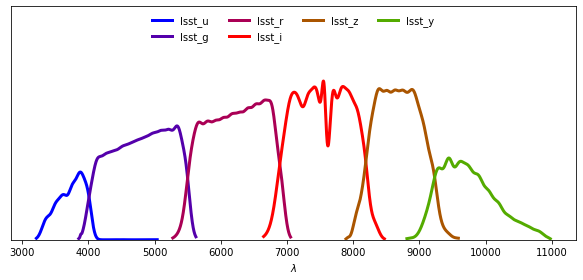

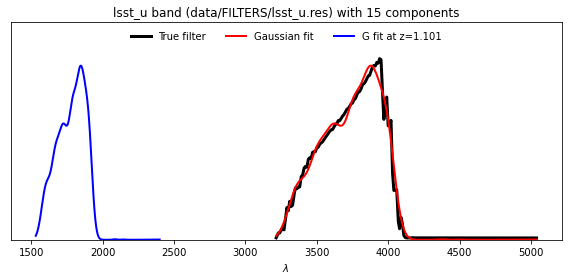

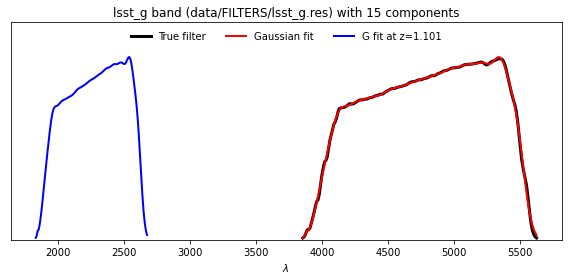

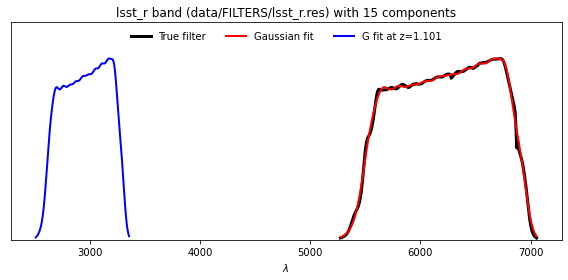

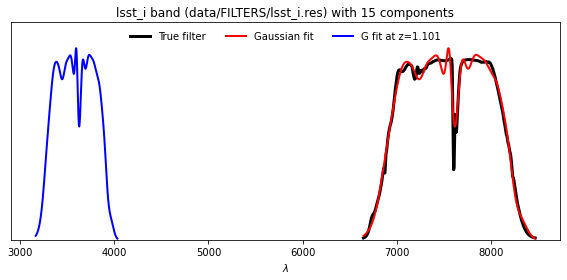

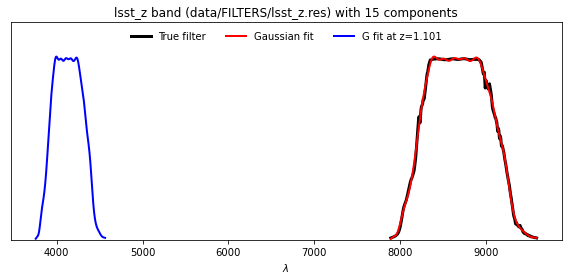

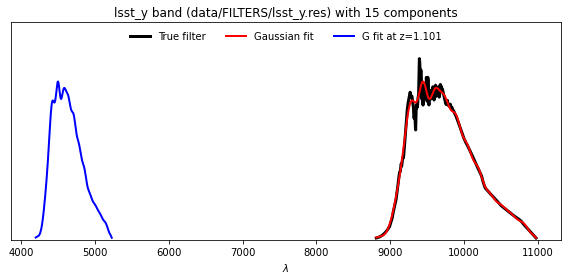

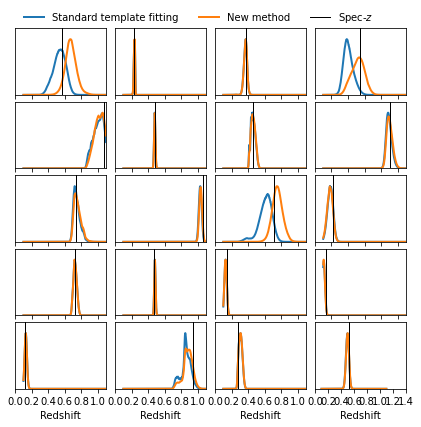

In [21]:
ncol = 4
fig, axs = plt.subplots(5, ncol, figsize=(7, 6), sharex=True, sharey=False)
axs = axs.ravel()
z = fluxredshifts[:, redshiftColumn]
sel = np.random.choice(nobj, axs.size, replace=False)
lw = 2
for ik in range(axs.size):
    k = sel[ik]
    print(k, end=" ")
    axs[ik].plot(redshiftGrid, pdfs_cww[k, :],lw=lw, label='Standard template fitting')# c="#2ecc71", 
    axs[ik].plot(redshiftGrid, pdfs[k, :], lw=lw, label='New method')  #, c="#3498db"
    axs[ik].axvline(fluxredshifts[k, redshiftColumn], c="k", lw=1, label=r'Spec-$z$')
    ymax = np.max(np.concatenate((pdfs[k, :], pdfs_cww[k, :])))
    axs[ik].set_ylim([0, ymax*1.2])
    axs[ik].set_xlim([0, 1.1])
    axs[ik].set_yticks([])
    axs[ik].set_xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4])
for i in range(ncol):
    axs[-i-1].set_xlabel('Redshift', fontsize=10)
axs[0].legend(ncol=3, frameon=False, loc='upper left', bbox_to_anchor=(0.0, 1.4))
fig.tight_layout()
fig.subplots_adjust(wspace=0.1, hspace=0.1, top=0.96)


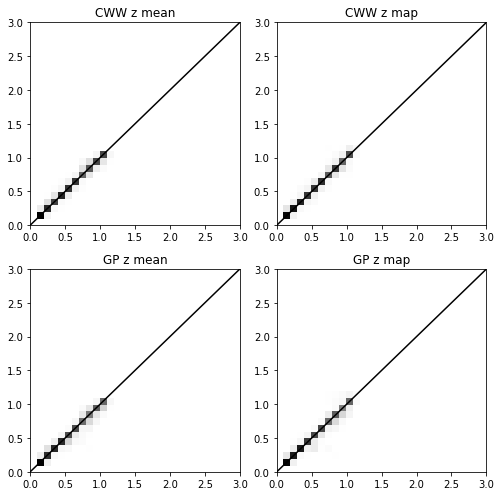

In [22]:
fig, axs = plt.subplots(2, 2, figsize=(7, 7))
zmax = 3
rr = [[0, zmax], [0, zmax]]
nbins = 30
h = axs[0, 0].hist2d(metricscww[:, i_zt], metricscww[:, i_zm], nbins, cmap='Greys', range=rr)
hmin, hmax = np.min(h[0]), np.max(h[0])
axs[0, 0].set_title('CWW z mean')
axs[0, 1].hist2d(metricscww[:, i_zt], metricscww[:, i_zmap], nbins, cmap='Greys', range=rr, vmax=hmax)
axs[0, 1].set_title('CWW z map')
axs[1, 0].hist2d(metrics[:, i_zt], metrics[:, i_zm], nbins, cmap='Greys', range=rr, vmax=hmax)
axs[1, 0].set_title('GP z mean')
axs[1, 1].hist2d(metrics[:, i_zt], metrics[:, i_zmap], nbins, cmap='Greys', range=rr, vmax=hmax)
axs[1, 1].set_title('GP z map')
axs[0, 0].plot([0, zmax], [0, zmax], c='k')
axs[0, 1].plot([0, zmax], [0, zmax], c='k')
axs[1, 0].plot([0, zmax], [0, zmax], c='k')
axs[1, 1].plot([0, zmax], [0, zmax], c='k')
fig.tight_layout()

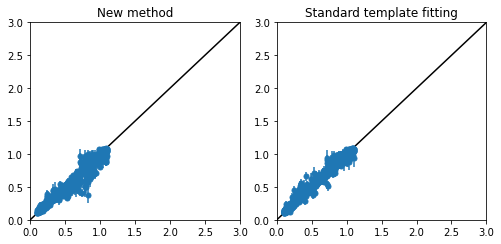

In [23]:
fig, axs = plt.subplots(1, 2, figsize=(7, 3.5))
chi2s = ((metrics[:, i_zt] - metrics[:, i_ze])/metrics[:, i_std_ze])**2

axs[0].errorbar(metrics[:, i_zt], metrics[:, i_ze], yerr=metrics[:, i_std_ze], fmt='o', markersize=5, capsize=0)
axs[1].errorbar(metricscww[:, i_zt], metricscww[:, i_ze], yerr=metricscww[:, i_std_ze], fmt='o', markersize=5, capsize=0)
axs[0].plot([0, zmax], [0, zmax], 'k')
axs[1].plot([0, zmax], [0, zmax], 'k')
axs[0].set_xlim([0, zmax])
axs[1].set_xlim([0, zmax])
axs[0].set_ylim([0, zmax])
axs[1].set_ylim([0, zmax])
axs[0].set_title('New method')
axs[1].set_title('Standard template fitting')

fig.tight_layout()

Text(0.5, 1.0, 'New method')

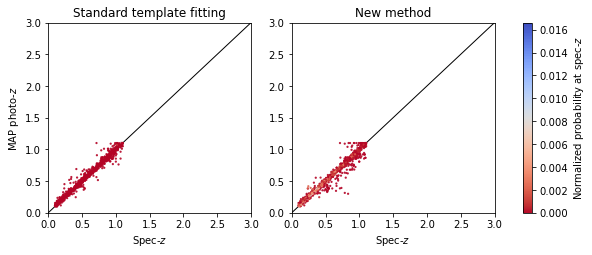

In [24]:
cmap = "coolwarm_r"
vmin = 0.0
alpha = 0.9
s = 5
fig, axs = plt.subplots(1, 2, figsize=(10, 3.5))
vs = axs[0].scatter(metricscww[:, i_zt], metricscww[:, i_zmap], 
                    s=s, c=pdfatZ_cww, cmap=cmap, linewidth=0, vmin=vmin, alpha=alpha)
vs = axs[1].scatter(metrics[:, i_zt], metrics[:, i_zmap], 
                    s=s, c=pdfatZ, cmap=cmap, linewidth=0, vmin=vmin, alpha=alpha)
clb = plt.colorbar(vs, ax=axs.ravel().tolist())
clb.set_label('Normalized probability at spec-$z$')
for i in range(2):
    axs[i].plot([0, zmax], [0, zmax], c='k', lw=1, zorder=0, alpha=1)
    axs[i].set_ylim([0, zmax])
    axs[i].set_xlim([0, zmax])
    axs[i].set_xlabel('Spec-$z$')
axs[0].set_ylabel('MAP photo-$z$')

axs[0].set_title('Standard template fitting')
axs[1].set_title('New method')

## Conclusion
Don't be too harsh with the results of the standard template fitting or the new methods since both have a lot of parameters which can be optimized!

If the results above made sense, i.e. the redshifts are reasonnable for both methods on the mock data, then you can start modifying the parameter files and creating catalog files containing actual data! I recommend using less than 20k galaxies for training, and 1000 or 10k galaxies for the delight-apply script at the moment. Future updates will address this issue.